# Generate figures in paper

Combined data from datasets 300 C #1, #2, #3.

Håkon Wiik Ånes (hakon.w.anes@ntnu.no)

Import required packages and print their versions

In [1]:
%matplotlib inline

from datetime import date
import importlib_metadata
import gc
import os

import dask
from dask.diagnostics import ProgressBar
from matplotlib_scalebar.scalebar import ScaleBar
from mpl_toolkits.axes_grid1 import host_subplot
import matplotlib.colors as mcolors
import matplotlib.lines as mlines
import matplotlib.patches as mpatches
import matplotlib.pyplot as plt
import morphops
import numpy as np
import pandas
import scipy.ndimage as ndimage
import scipy.stats as scs
import skimage.color as skc
import skimage.transform as skt

from mapregions import MapRegions


# Directories for input and output
dset_no = 1  # Data set number
dir_sample = "/home/hakon/phd/data/p/prover/300c"
dir_article = "/home/hakon/phd/artikler_abstract/202104_correlating_ebsd_bse/latex"
dir_bse = os.path.join(dir_sample, str(dset_no), "bse")
dir_imreg = os.path.join(dir_sample, str(dset_no), "imreg")
dir_kp = os.path.join(dir_sample, str(dset_no), "kp")
dir_mtex = os.path.join(dir_sample, str(dset_no), "mtex")
if dset_no == 1:
    dir_article_fig = os.path.join(dir_article, "fig")
else:
    dir_article_fig = os.path.join(dir_article, "supplementary/fig", str(dset_no))
    
# Matplotlib configuration and keyword arguments
plt.rcParams.update({"font.size": 13, "figure.dpi": 300})
scalebar_kwds = dict(
    units="um",
    dimension="si-length",
    location="lower left",
    pad=0.2,
    sep=3,
    border_pad=0.5,
    box_alpha=0.6,
    fixed_value=15,
)
scatter_kwds = dict(s=70, linewidth=2, facecolor="none", clip_on=False)
savefig_kwds = dict(bbox_inches="tight", pad_inches=0, dpi=300, transparent=True)
title_kwds = dict(ha="left", va="bottom", fontweight="bold")

# Nominal step sizes nm/px
step_size = dict(ebsd=100, bse=1 / 38.5e-3)

# Particle size thresholds
dispersoid_threshold = 0.24  # um
constituent_threshold = 0.8  # um

# Data set specific parameters
out_shapes = {1: (1000, 1000), 2: (1200, 1200), 3: (1200, 1400)}
shift_rc = {1: (-45, -37), 2: (-13, -61), 3: (-42, -58)}
cp_fig_w_pad = {1: -10, 2: -15, 3: -15}
grid_fig_w_pad = {1: -3.5, 2: -14, 3: -12}
overlap_fig_w_pad = {1: -8.5, 2: -20, 3: -18}
overlap_fig_fontsize_sub = {1: 1, 2: 3, 3: 3}
map_width_dset = {1: 916, 2: 722, 3: 839}

print("Run date: ", date.today())
print("\nSoftware versions\n-----------------")
for pkg in (
    "dask",
    "mapregions",
    "matplotlib",
    "matplotlib_scalebar",
    "morphops",
    "numpy",
    "pandas",
    "scipy",
    "scikit-image"
):
    if pkg == "numpy":
        ver = np.__version__
    else:
        ver = importlib_metadata.version(pkg)
    print(pkg, ":", ver)

Run date:  2022-07-24

Software versions
-----------------
dask : 2022.6.0
mapregions : 0.1.dev0
matplotlib : 3.5.2
matplotlib_scalebar : 0.8.1
morphops : 0.1.13
numpy : 1.22.4
pandas : 1.4.2
scipy : 1.8.1
scikit-image : 0.19.3


Custom error bar legend from https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler.

In [2]:
class AnyObject:
    pass


class AnyObjectHandler:
    """Custom error bar legend from
    https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler.
    """
    def legend_artist(self, legend, orig_handle, fontsize, handlebox):
        x0, y0 = handlebox.xdescent, handlebox.ydescent
        width, height = handlebox.width, handlebox.height
        wratio = 0.25
        x1, y1 = ((x0 + width * wratio, width * (1 - wratio)), (y0, y0))
        x2, y2 = ((x0 + width * wratio, width * (1 - wratio)), (height, height))
        x3, y3 = ((width / 2,) * 2, (y0, height))
        for x, y in zip((x1, x2, x3), (y1, y2, y3)):
            patch = mlines.Line2D(x, y, color="k", transform=handlebox.get_transform())
            handlebox.add_artist(patch)
        return patch

## Figure 1. Control points

Read images to register

In [3]:
bse = plt.imread(os.path.join(dir_bse, "4500x_cropped2_fused_cropped.png"))
bse = skc.rgb2gray(bse[..., :3])
ebsd = plt.imread(os.path.join(dir_kp, "maps_mean_q1_q99.png"))
ebsd = skc.rgb2gray(ebsd[..., :3])

out_shapes[dset_no] += np.mod(ebsd.shape, 2)

Read control points

In [4]:
cpx_ebsd, cpy_ebsd, cpx_bse, cpy_bse = np.loadtxt(
    os.path.join(dir_imreg, "cps_300c_cropped2_fused_cropped.csv"),
    skiprows=1,
    delimiter=",",
    unpack=True,
)
n_cps = cpx_ebsd.size
cp_ebsd = np.column_stack([cpy_ebsd, cpx_ebsd])
cp_bse = np.column_stack([cpy_bse, cpx_bse])

# Scale BSE CPs to maintain EBSD resolution
cp_bse_scaled = cp_bse / (step_size["ebsd"] / step_size["bse"])

# Translate BSE CPs
cp_bse_translate = cp_bse_scaled - (cp_bse_scaled.mean(axis=0) - cp_ebsd.mean(axis=0))

Plot images to register with control points

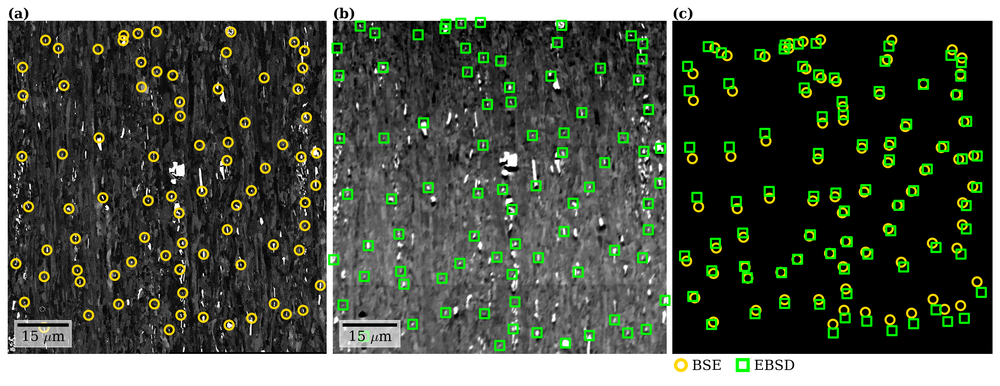

In [5]:
# Keyword arguments shared among Matplotlib calls
imshow_kwds = dict(cmap="gray", interpolation=None)
markers = ["o", "s"]
marker_colors = ["gold", "lime"]

fig, axes = plt.subplots(ncols=3, figsize=(15, 5))
ax0, ax1, ax2 = axes
ax0.imshow(bse, **imshow_kwds)
ax1.imshow(ebsd, **imshow_kwds)
pad = (130, 70)
# Shape of figure of relative positions between CPs
nr, nc = tuple(np.max(np.concatenate((cp_bse_translate, cp_ebsd)), axis=0).astype(int) + np.array(pad))
ax2.imshow(np.zeros((nr, nc)), cmap="gray")

# Legend
names = ["BSE", "EBSD"]
handles = []
marker_kwds = dict(linestyle="None", markersize=10, fillstyle="none", markeredgewidth=3)
for i in range(len(names)):
    handle = mlines.Line2D([], [], color=marker_colors[i], label=names[i], marker=markers[i], **marker_kwds)
    handles.append(handle)
ax2.legend(
    bbox_to_anchor=(-0.035, 0),
    loc="upper left",
    borderaxespad=0,
    handles=handles,
    handletextpad=-0.2,
    frameon=False,
    columnspacing=0.5,
    ncol=len(names)
)

# Scalebars
ax0.add_artist(ScaleBar(dx=step_size["bse"] * 1e-3, **scalebar_kwds))
ax1.add_artist(ScaleBar(dx=step_size["ebsd"] * 1e-3, **scalebar_kwds))

# Control points
for i, (y, x) in enumerate(cp_bse):
    ax0.scatter(x, y, marker=markers[0], color=marker_colors[0], **scatter_kwds)
for i, (y, x) in enumerate(cp_ebsd):
    ax1.scatter(x, y, marker=markers[1], color=marker_colors[1], **scatter_kwds)
for i, these_points in enumerate((cp_bse_translate, cp_ebsd)):
    for r, c in these_points:
        ax2.scatter(
            c + pad[1] / 2,
            r + pad[0] / 2,
            color=marker_colors[i],
            marker=markers[i],
            **scatter_kwds
        )

# Remove margins and add subfigure titles
if dset_no in [1, 2]:
    titles = ("(a)", "(b)", "(c)")
else:
    titles = ("(d)", "(e)", "(f)")
for ax, title in zip(axes, titles):
    ax.axis("off")
    ax.margins(0, 0)
    ax.text(0, 1, title, transform=ax.transAxes, **title_kwds)
fig.tight_layout(w_pad=cp_fig_w_pad[dset_no])

fig.savefig(os.path.join(dir_article_fig, "control_points", "_control_points_only.svg"), **savefig_kwds)

## Figure 2. Grid before and after correction of EBSD intensity map

Get inverse mapping from BSE image to EBSD map using the thin-plate spline (TPS)
transformation function

In [6]:
# Output shape of corrected EBSD map
out_shape = out_shapes[dset_no]
out_size = int(np.prod(out_shape))

# 2D indices (flattened) for each point in the output map
rc_out = np.indices(out_shape, dtype=float).reshape((2, -1)).T

# Obtain inverse mapping one chunk at a time to reduce memory use. This is done
# by first accumulating a list of delayed computations...
delayed_list = []
n_chunks = 100
chunk_size = int(np.ceil(out_size / n_chunks))
for idx in range(0, n_chunks * chunk_size, chunk_size):
    rc_chunk = rc_out[idx:idx + chunk_size]
    rc_in_part = dask.delayed(morphops.tps_warp)(X=cp_bse_scaled, Y=cp_ebsd, pts=rc_chunk)
    delayed_list.append(rc_in_part)

# ... and then computing the inverse mappings
with ProgressBar():
    rc_in_parts = dask.compute(*delayed_list)
rc_in = np.row_stack(rc_in_parts)

[########################################] | 100% Completed |  3.2s


Define some convenience functions used repeatedly for obtaining corresponding
points in input and output arrays (images)

In [7]:
def get_mapping_arrays(rc_in, in_shape, out_shape):
    """Get 1D and 2D indices of corresponding points in input and output arrays.

    Parameters
    ----------
    rc_in : numpy.ndarray
    in_shape : tuple
    out_shape : tuple
    
    Returns
    -------
    rc_in_1d : numpy.ndarray
    rc_in_2d : tuple of numpy.ndarray
    rc_out_1d : numpy.ndarray
    rc_out_2d : tuple of numpy.ndarray
    """
    # Round exact input coordinates to nearest neighbour coordinates
    rc_in_int = np.round(rc_in).astype(int)

    # Set up output coordinate array
    rc_out = np.indices(out_shape).reshape((2, -1)).T
    
    # Remove coordinates outside input map in both arrays
    is_outside = np.logical_or((rc_in_int < 0).any(axis=1), (rc_in_int >= np.array(in_shape)).any(axis=1))
    is_outside_idx = np.where(is_outside)[0]
    rc_in_int = np.delete(rc_in_int, is_outside_idx, axis=0)
    rc_out = np.delete(rc_out, is_outside_idx, axis=0)
    
    # Get 1D indices
    rc_in_1d = np.ravel_multi_index(rc_in_int.T, in_shape)
    rc_out_1d = np.ravel_multi_index(rc_out.T, out_shape)

    # 2D coordinate arrays
    rc_in_2d = np.unravel_index(rc_in_1d, in_shape)
    rc_out_2d = np.unravel_index(rc_out_1d, out_shape)
    
    return rc_in_1d, rc_in_2d, rc_out_1d, rc_out_2d


def map_in_image(in_image, out_shape, rc_in_2d, rc_out_2d):
    """Map sensed (in) image from sensed coordinates to reference coordinates.
    
    Parameters
    ----------
    in_image : numpy.ndarray
    out_shape : tuple
    rc_in_2d : tuple of numpy.ndarray
    rc_out_2d : tuple of numpy.ndarray
    
    Returns
    -------
    out_image : numpy.ndarray
    """
    out_image = np.zeros(out_shape, dtype=in_image.dtype)
    out_image[rc_out_2d] = in_image[rc_in_2d]
    return out_image

Get indices of corresponding points in EBSD map (in/sensed) and the BSE image
(out/reference)

In [8]:
rc_in_1d, rc_in_2d, rc_out_1d, rc_out_2d = get_mapping_arrays(
    rc_in=rc_in, in_shape=ebsd.shape, out_shape=out_shape
)

Correct distortions in the EBSD map. Since the EBSD map coordinate (0, 0) does
not coincide with the BSE image coordinate (0, 0), we shift it by an amount
found manually

In [9]:
# Account for difference in output map shape and original shape
pad_grid = np.round((np.array(out_shape) - np.array(ebsd.shape)) / 2).astype(int)
# Add shift found manually
shift_r, shift_c = pad_grid + shift_rc[dset_no]
# Apply shift to 2D output coordinates found from inverse mapping
rc_out_2d = (rc_out_2d[0] + shift_r, rc_out_2d[1] + shift_c)

# Correct distortions in the EBSD map
ebsd_correct = map_in_image(ebsd, out_shape, rc_in_2d, rc_out_2d)

Add a frame to the un-corrected and corrected EBSD intensity map

In [10]:
# Pixel width of each grid tile border
border_width = int(np.ceil(ebsd.shape[0] / 180))

# Add outer border to grid
grid = np.zeros_like(ebsd, dtype=bool)
fill = 1
grid[:border_width] = fill
grid[-border_width:] = fill
grid[:, :border_width] = fill
grid[:, -border_width:] = fill

# Add borders of the tiles inside the grid border
tile_width = int(np.ceil(ebsd.shape[0] / 20))
for i in range(tile_width, np.max(grid.shape), tile_width):
    grid[i:i + border_width, :] = fill
    grid[:, i:i + border_width] = fill

# Apply distortion correction to the grid as was done to the EBSD map
grid_correct = map_in_image(grid, out_shape, rc_in_2d, rc_out_2d)

# Pad both the EBSD map and grid
ebsd_padded = np.pad(ebsd, [(pad_grid[0],) * 2, (pad_grid[1],) * 2])
grid_padded = np.pad(grid, [(pad_grid[0],) * 2, (pad_grid[1],) * 2])

# Add the grid on top of the EBSD map and the corrected EBSD map, also making
# a combined array of both the grid and the corrected grid
ebsd_padded_grid = np.zeros(tuple(out_shape) + (3,))
ebsd_correct_grid = np.zeros(tuple(out_shape) + (3,))
grids = np.zeros(tuple(out_shape) + (3,))
grid_color = mcolors.to_rgb("orangered")
grid_correct_color = mcolors.to_rgb("cyan")
# Loop over color channels
for i in range(3):
    # Add EBSD map to channel
    ebsd_padded_grid[..., i] = ebsd_padded
    # Add grid to channel, using the grid itself as a mask (since it's full of 0s and 1s)
    ebsd_padded_grid[grid_padded, i] = grid_padded[grid_padded] * grid_color[i]

    # Apply the same operations to the corrected EBSD map
    ebsd_correct_grid[..., i] = ebsd_correct
    ebsd_correct_grid[grid_correct, i] = grid_correct[grid_correct] * grid_correct_color[i]

    # Combine the grid and the corrected grid
    grids[grid_padded, i] = grid_padded[grid_padded] * grid_color[i]
    grids[grid_correct, i] = grid_correct[grid_correct] * grid_correct_color[i]

Crop away unnecessary padding, while keeping some

In [11]:
# Find the coordinates of the edges of the grids in all three arrays
r_edges = [np.inf, -np.inf]
c_edges = [np.inf, -np.inf]
for img in [ebsd_padded_grid, ebsd_correct_grid, grids]:
    img_gray = skc.rgb2gray(img)
    edges = np.where(img_gray != 0)
    edges2 = np.where(img_gray.T != 0)  # Needed for one of the datasets
    r_edges = [min([r_edges[0], edges[0][0]]), max([r_edges[1], edges[0][-1]])]
    c_edges = [min([c_edges[0], edges[1][0], edges2[0][0]]), max([c_edges[1], edges[1][-1]])]

keep_padding = 20
sl = (
    slice(max(r_edges[0] - keep_padding, 0), r_edges[1] + keep_padding),
    slice(max(c_edges[0] - 2 * keep_padding, 0), c_edges[1] + keep_padding)
)

Plot

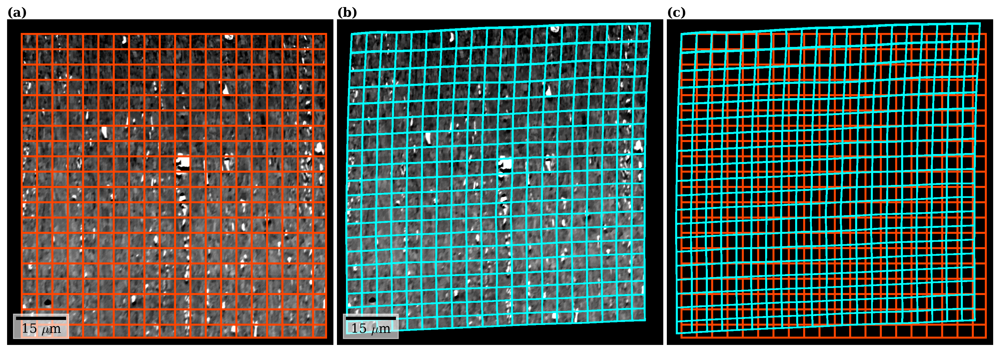

In [12]:
fig, axes = plt.subplots(ncols=3, figsize=(15, 5))
axes[0].imshow(ebsd_padded_grid[sl])
axes[1].imshow(ebsd_correct_grid[sl])
axes[2].imshow(grids[sl])
if dset_no in [1, 2]:
    titles = ("(a)", "(b)", "(c)")
else:
    titles = ("(d)", "(e)", "(f)")
for i, ax in enumerate(axes):
    ax.text(0, 1, titles[i], transform=ax.transAxes, **title_kwds)
    if i != 2:
        ax.add_artist(ScaleBar(dx=step_size["ebsd"] * 1e-3, **scalebar_kwds))
    ax.axis("off")
fig.tight_layout(w_pad=grid_fig_w_pad[dset_no])
fig.savefig(os.path.join(dir_article_fig, "image_registration", "image_registration.pdf"), **savefig_kwds)
gc.collect();

## Figure 3. Particles detected in BSE image and EBSD intensity image

Read particles detected in the BSE image using the `particle_detection.ipynb`
notebook

In [13]:
n_particles_bse = np.load(os.path.join(dir_imreg, "n_particles_roi.npy"))
label_map_bse, _ = ndimage.label(n_particles_bse != 0)
regions_bse = MapRegions(label_map_bse, background_label=0)
regions_bse

MapRegions: 4972

Read particles detected in the EBSD intensity map using the same notebook

In [14]:
mask = np.load(os.path.join(dir_imreg, "mask_ebsd_correct.npy"))
label_map_ebsd = np.load(os.path.join(dir_imreg, "ebsd_labels_filled.npy"))
regions_ebsd = MapRegions(label_map_ebsd, background_label=0)
regions_ebsd

MapRegions: 217

Color particle maps

In [15]:
# EBSD
ebsd_color = (0, 1, 0)
is_particle_ebsd = ~regions_ebsd.is_background_map
particles_ebsd = np.ones(regions_ebsd.map_shape + (3,))
particles_ebsd[is_particle_ebsd] = ebsd_color

# BSE
bse_color = (1, 0, 1)
is_particle_bse = ~regions_bse.is_background_map
particles_bse = np.ones(regions_bse.map_shape + (3,))
particles_bse[is_particle_bse] = bse_color

# Overlapped
particles_overlap = np.ones(regions_ebsd.map_shape + (3,))
particles_overlap[is_particle_ebsd] -= bse_color
particles_overlap[is_particle_bse] -= ebsd_color

Quantify overlap of total pixels not white:
* % black
* % pink
* % green

In [16]:
n_pixels = int(np.prod(particles_overlap.shape[:2]))

particles_overlap_flat = particles_overlap.reshape((n_pixels, 3))
unique_colors, counts = np.unique(particles_overlap_flat, axis=0, return_counts=True)
# (000), (010), (101), (111)

In [17]:
n_colored_pixels = n_pixels - counts[3]
n_overlap_pixels = counts[0]
n_ebsd_pixels = counts[1]
n_bse_pixels = counts[2]

pct_overlap = 100 * n_overlap_pixels / n_colored_pixels
pct_ebsd = 100 * n_ebsd_pixels / n_colored_pixels
pct_bse = 100 * n_bse_pixels / n_colored_pixels

print(
    f"Pixels:\t\t\t{n_pixels}",
    f"\nColored pixels (%):\t{n_colored_pixels} (100%)"
    f"\nOverlap (%):\t\t{n_overlap_pixels} ({pct_overlap:.2f}%)"
    f"\nEBSD (%):\t\t{n_ebsd_pixels} ({pct_ebsd:.2f}%)"
    f"\nBSE (%):\t\t{n_bse_pixels} ({pct_bse:.2f}%)"
)

Pixels:			1000000 
Colored pixels (%):	35409 (100%)
Overlap (%):		12831 (36.24%)
EBSD (%):		3215 (9.08%)
BSE (%):		19363 (54.68%)


Set up maps for plotting

In [18]:
particles_ebsd_mask = np.zeros(particles_ebsd.shape)
particles_bse_mask = np.zeros_like(particles_ebsd_mask)
particles_overlap_mask = np.zeros_like(particles_ebsd_mask)
is_particle_ebsd_mask = np.zeros(particles_ebsd.shape[:2])

particles_ebsd_mask[mask] = particles_ebsd[mask]
particles_bse_mask[mask] = particles_bse[mask]
particles_overlap_mask[mask] = particles_overlap[mask]
is_particle_ebsd_mask[mask] = is_particle_ebsd[mask]

r_mask, c_mask = np.where(mask)
slice_mask = (slice(r_mask.min(), r_mask.max()), slice(c_mask.min(), c_mask.max()))

Plot particle maps

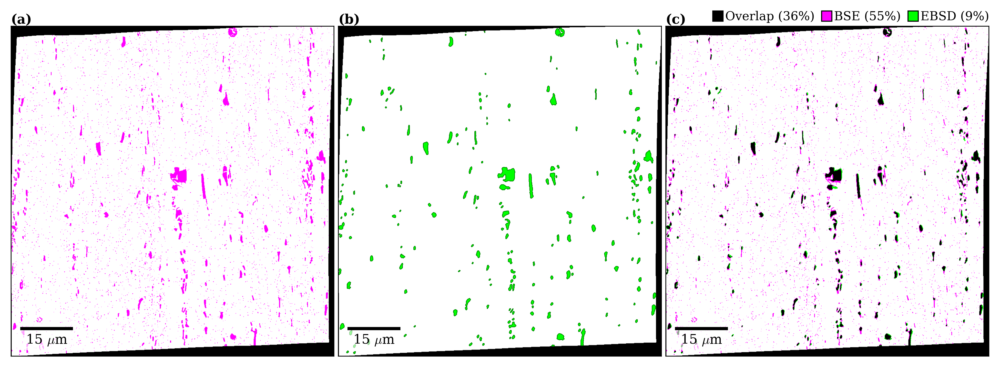

In [19]:
fig, axes = plt.subplots(ncols=3, figsize=(15, 5))
ax0, ax1, ax2 = axes

# Images
ax0.imshow(particles_bse_mask[slice_mask])
ax1.imshow(particles_ebsd_mask[slice_mask])
ax2.imshow(particles_overlap_mask[slice_mask])

# Contours on EBSD map
ax1.contour(is_particle_ebsd_mask[slice_mask], colors=((0, 0.5, 0),), linewidths=0.25)

# Legend c)
names = (
    f"EBSD ({np.round(pct_ebsd):.0f}%)",
    f"BSE ({np.round(pct_bse):.0f}%)",
    f"Overlap ({np.round(pct_overlap):.0f}%)"
)
colors = [ebsd_color, bse_color, "k"]
marker_kwds = dict(linestyle="None", markersize=10, markeredgecolor="k")
handles = []
for i in range(len(names)):
    handle = mlines.Line2D([], [], color=colors[i], label=names[i], marker="s", **marker_kwds)
    handles.append(handle)
ax2.legend(
    bbox_to_anchor=(0.975, 1.02),
    handles=handles[::-1],
    ncol=3,
    handletextpad=-0.4,
    columnspacing=0,
    borderaxespad=-1,
    borderpad=0.3,
    frameon=False,
    fontsize=plt.rcParams["font.size"] - overlap_fig_fontsize_sub[dset_no],
)

if dset_no in [1, 2]:
    titles = ("(a)", "(b)", "(c)")
else:
    titles = ("(d)", "(e)", "(f)")
for ax, title in zip(axes, titles):
    ax.text(0, 1, title, transform=ax.transAxes, **title_kwds)
    ax.add_artist(ScaleBar(dx=step_size["ebsd"] * 1e-3, **scalebar_kwds))
    ax.axes.get_xaxis().set_visible(False)
    ax.axes.get_yaxis().set_visible(False)

fig.tight_layout(w_pad=overlap_fig_w_pad[dset_no])
fig.savefig(os.path.join(dir_article_fig, "overlapping_particles", "overlapping_particles.pdf"), **savefig_kwds)

## Figure 4. Multi-modal data set with subgrains and particles

Read orientation and grain maps generated with `MTEX` using
`orientation_analysis.m`. Also read a BSE image of the EBSD map region of interest
without any padding

In [20]:
ipf_map = plt.imread(os.path.join(dir_mtex, "maps_om_ipf_rd.png"))
grain_map = plt.imread(os.path.join(dir_mtex, "maps_grains_ideal_particles.png"))
reg_bse = plt.imread(os.path.join(dir_imreg, "reg_bse_no_padding.png"))
reg_bse = skc.rgb2gray(reg_bse[..., :3])

ipf = plt.imread(os.path.join(dir_mtex, "ipf_annotated.png"))

# Map width has changed after correction, from 919 to 916
map_width = map_width_dset[dset_no]

Define squares to show in more detail

In [21]:
detail_scale = reg_bse.shape[0] / ipf_map.shape[0]
ipf_map_scale = skt.rescale(ipf_map, detail_scale, channel_axis=2)
grain_map_scale = skt.rescale(grain_map, detail_scale, channel_axis=2)

# Detail slice
sl_detail = (slice(1480, 2110), slice(1304, 2179))

# Detail rectangle values
xy = np.array((sl_detail[1].start, sl_detail[0].start)) / detail_scale
width = (sl_detail[1].stop / detail_scale) - xy[0]
height = (sl_detail[0].stop / detail_scale) - xy[1]
rectangle_kwds = dict(xy=xy, width=width, height=height, ec="w", fc="none", linewidth=2)

In [22]:
fs = plt.rcParams["font.size"]
plt.rcParams["font.size"] = 10

### IPF map

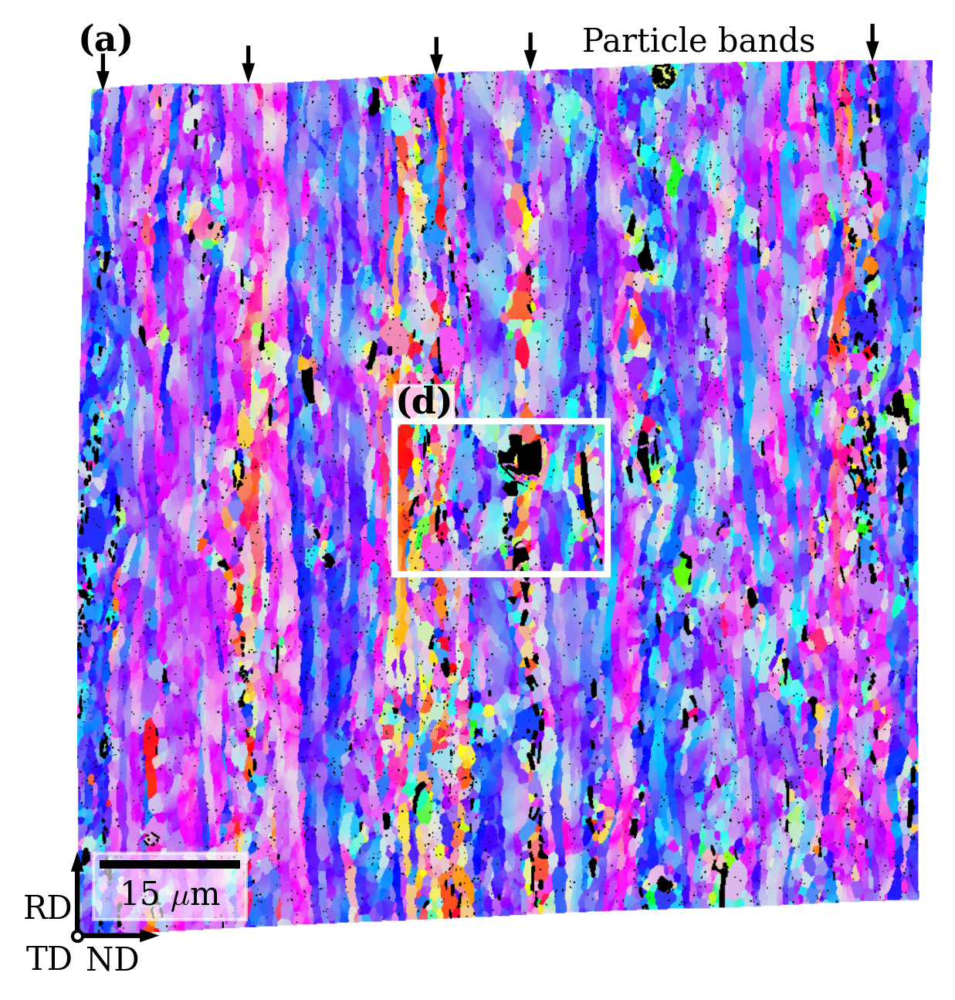

In [23]:
# Remove border when saved with Matlab (export_fig)
ipf_map2 = ipf_map[3:-3, 3:-3]

fig, ax = plt.subplots(figsize=(5, 5))
ax.imshow(ipf_map2)
ax.add_artist(ScaleBar(dx=(map_width / ipf_map2.shape[1]) * step_size["ebsd"] * 1e-3, **scalebar_kwds))
title = "(a)" if dset_no in [1, 2] else "(c)"
ax.text(0, 1.002, title, fontweight="bold", fontsize=11, transform=ax.transAxes, ha="left", va="bottom")
ax.axis("off")
dx = 0.075

# Sample reference frame
width = 0.002
head_width = 5 * width
arrow_kwargs = dict(
    transform=ax.transAxes, clip_on=False, width=width, head_width=head_width, fc="k"
)
ax.arrow(0, 0, 0, dx, **arrow_kwargs)
ax.arrow(0, 0, dx, 0, **arrow_kwargs)
ax.scatter(0, 0, marker="o", s=10, ec="k", c="w", transform=ax.transAxes, zorder=2, clip_on=False);
(x, y) = (-0.005, -0.01)
ax.text(x, dx * 0.4, "RD", transform=ax.transAxes, va="center", ha="right")
ax.text(dx * 0.55, y, "ND", transform=ax.transAxes, va="top", ha="center")
ax.text(x, y, "TD", transform=ax.transAxes, va="top", ha="right")
if dset_no == 1:
    # Detail rectangle
    ax.add_artist(mpatches.Rectangle(**rectangle_kwds))
    ax.text(*rectangle_kwds["xy"], "(d)", fontweight="bold", va="bottom", ha="left", color="k", fontsize=11, bbox=dict(color="w", alpha=0.75, boxstyle="round,pad=0"));
    # Arrows indicating particle bands
    ax.text(0.59, 1.01, "Particle bands", transform=ax.transAxes)
    x_band = (0.03, 0.2, 0.42, 0.53, 0.93)
    y_band = (1.006, 1.015, 1.025, 1.03, 1.04)
    for x, y in zip(x_band, y_band):
        ax.arrow(x, y, dx=0, dy=-0.02, transform=ax.transAxes, clip_on=False, head_width=0.01, fc="k")
fig.savefig(os.path.join(dir_article_fig, "grains_particles", "ipf_map.svg"), **savefig_kwds)

### Grains

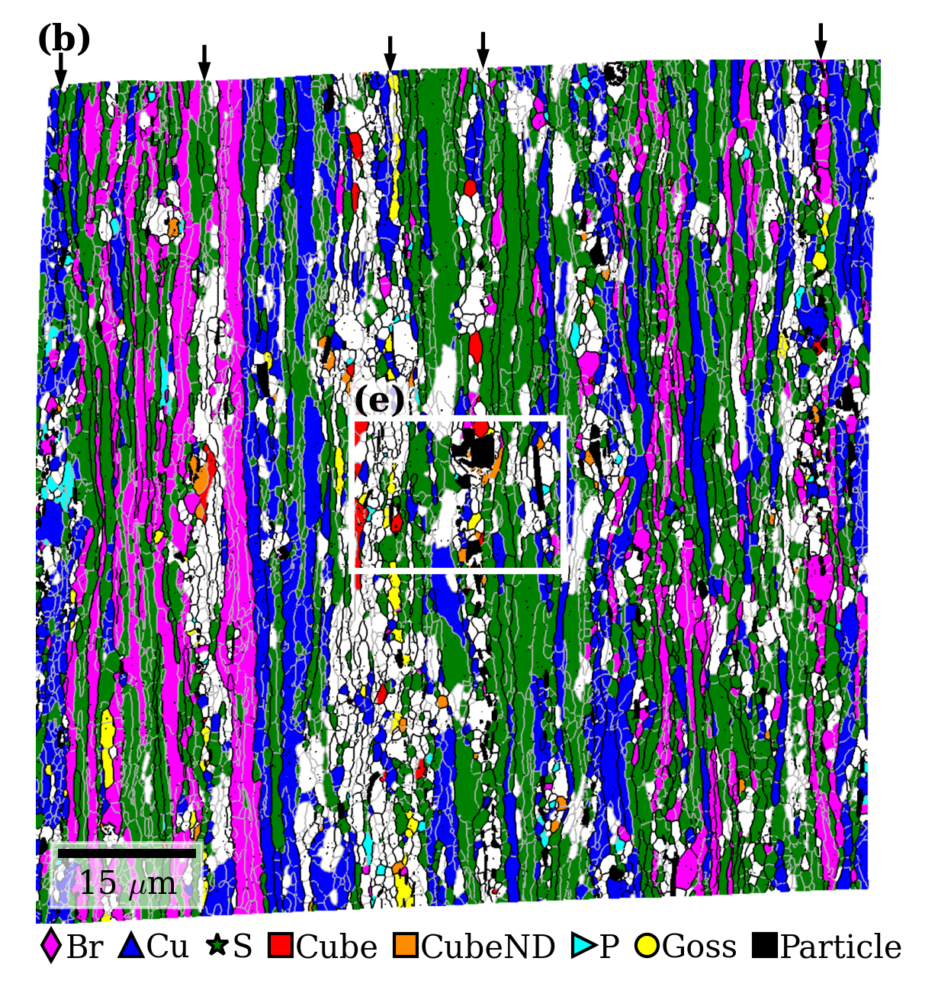

In [24]:
grain_map2 = grain_map[5:-4, 5:-4]

fig, ax = plt.subplots(figsize=(5, 5))
ax.imshow(grain_map2)
title = "(b)" if dset_no in [1, 2] else "(d)"
ax.text(0, 1.002, title, fontsize=11, fontweight="bold", transform=ax.transAxes, ha="left", va="bottom")
ax.add_artist(ScaleBar(dx=(map_width / grain_map2.shape[1]) * step_size["ebsd"] * 1e-3, **scalebar_kwds))
ax.axis("off")
ax.margins(0, 0)
names = ["Br", "Cu", "S", "Cube", "CubeND", "P", "Goss", "Particle"]
markers = ["d", "^", "*", "s", "s", ">", "o", "s"]
colors = [(1, 0, 1), (0, 0, 1), (0, 0.5, 0), (1, 0, 0), (1, 0.55, 0), (0, 1, 1), (1, 1, 0), (0, 0, 0)]
marker_kwds = dict(linestyle="None", markersize=7, markeredgecolor="k")
handles = []
for i in range(len(names)):
    handle = mlines.Line2D([], [], color=colors[i], label=names[i], marker=markers[i], **marker_kwds)
    handles.append(handle)
ax.legend(
    bbox_to_anchor=(-0.015, 0.005),
    loc="upper left",
    borderaxespad=0,
    handles=handles,
    handlelength=1,
    handleheight=1,
    handletextpad=-0.05,
    frameon=False,
    columnspacing=0.35,
    ncol=len(names)
)
if dset_no == 1:
    # Detail rectangle
    ax.add_artist(mpatches.Rectangle(**rectangle_kwds));
    ax.text(*rectangle_kwds["xy"], "(e)", fontweight="bold", va="bottom", ha="left", color="k", fontsize=11, bbox=dict(color="w", alpha=0.75, boxstyle="round,pad=0"))
    # Arrows indicating particle bands
    for x, y in zip(x_band, y_band):
        ax.arrow(x, y, dx=0, dy=-0.02, transform=ax.transAxes, clip_on=False, head_width=0.01, fc="k")
fig.savefig(os.path.join(dir_article_fig, "grains_particles", "grains_ideal.svg"), **savefig_kwds)

### IPF (not used)

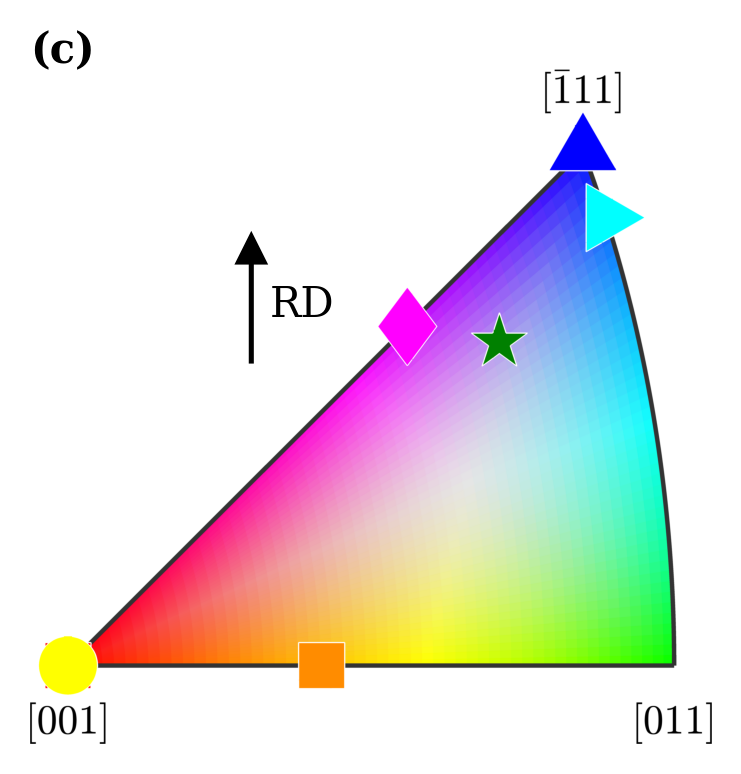

In [25]:
fig, ax = plt.subplots(figsize=(3, 3))
ax.imshow(ipf)
ax.set_ylim(ipf.shape[0], ipf.shape[0] * 0.12)
ax.text(0, 0.99, "(c)", transform=ax.transAxes, **title_kwds)
ax.text(0.4, 0.6, s="RD", transform=fig.transFigure)
ax.arrow(x=0.38, y=0.55, dx=0, dy=0.11, head_width=0.03, head_length=0.03, facecolor="k", transform=fig.transFigure)
ax.axis("off")
ax.margins(0, 0)
fig.savefig(os.path.join(dir_article_fig, "grains_particles", "ipf.svg"), **savefig_kwds)

In [26]:
if dset_no != 1:
    raise ValueError("No more figures from data set 2 or 3 from here on out")

### Details in maps

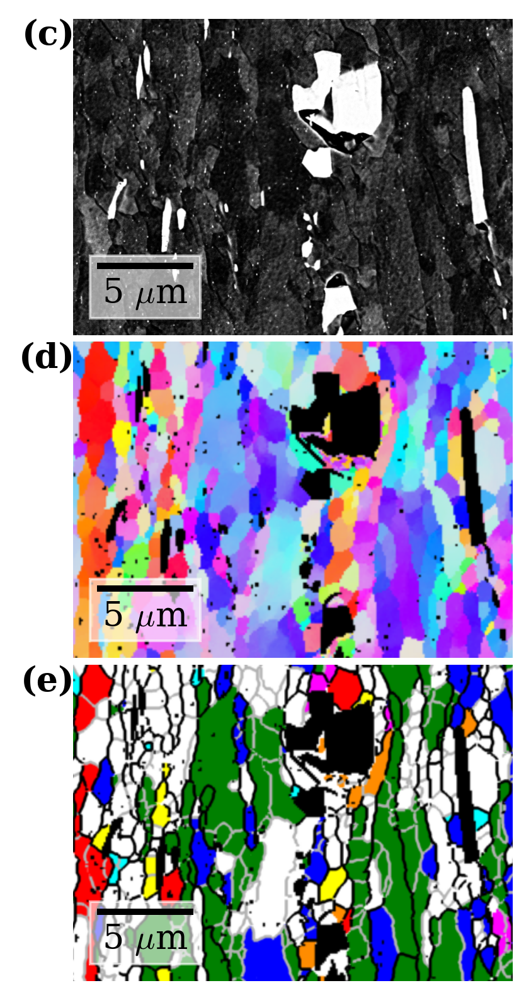

In [27]:
fs = plt.rcParams["font.size"]
plt.rcParams["font.size"] = 13

# Scalebar
scalebar_kwds_details = scalebar_kwds.copy()
scalebar_kwds_details.update({
    "dx": (map_width / ipf_map.shape[1]) * step_size["ebsd"] * 1e-3 / detail_scale,
    "fixed_value": 5,
    "width_fraction": 0.02,
})

sl_map = (slice(1480, 2110), slice(1304, 2179))

text_kwds = dict(x=0.005, y=1, fontweight="bold", ha="right", va="top")
labels = ("(c)", "(d)", "(e)")

fig, ax = plt.subplots(nrows=3, figsize=(3, 9), sharex=True, sharey=True)
ax[0].imshow(reg_bse[sl_map], cmap="gray")
ax[1].imshow(ipf_map_scale[sl_map])
ax[2].imshow(grain_map_scale[sl_map])
for i, a in enumerate(ax):
    a.axis("off")
    a.margins(0, 0)
    a.text(s=labels[i], transform=a.transAxes, **text_kwds)
    a.add_artist(ScaleBar(**scalebar_kwds_details))
fig.tight_layout(h_pad=-17.5)
fig.savefig(
    os.path.join(dir_article_fig, "grains_particles", "maps_detail.svg"),
    **savefig_kwds
)

In [28]:
plt.rcParams["font.size"] = fs

## Figure 5. Grain and particle statistics

### Combined grain statistics per component from all three data sets

* area fraction $F_V$
* number of grains
* area weighted grain size (equivalent circular diameter) $D_{\mathrm{A}}$

Read grain data from file generated with `MTEX` and set it up nicely in a
`pandas` `DataFrame`

In [29]:
# Load individual data frames of grains
grains1 = pandas.read_csv(os.path.join(dir_sample, "1/mtex/grains.txt"), delimiter=",")
grains2 = pandas.read_csv(os.path.join(dir_sample, "2/mtex/grains.txt"), delimiter=",")
grains3 = pandas.read_csv(os.path.join(dir_sample, "3/mtex/grains.txt"), delimiter=",")

# Make sure grains across data sets have unique IDs
n_grains1 = grains1.shape[0]
n_grains2 = grains2.shape[0]
n_grains3 = grains3.shape[0]
grains2["#id"] += n_grains1
grains3["#id"] += n_grains1 + n_grains2

# Create a single pandas data frame with all grains
dx = 0.1
grains = pandas.concat((grains1, grains2, grains3))
grains["area"] = grains["size"] * dx ** 2
grains["radius"] = np.sqrt(grains.area / np.pi)
grains["ecd"] = 0.816 * 2 * grains.radius
grains["is_al"] = grains.phase == 1

# Components
comp_names = ["Other", "Br", "Cu", "S", "Cube", "CubeND", "P", "Goss"]
comp_markers = ["o", "d", "^", "*", "s", "s", ">", "o"]
comp_colors = [(1, 1, 1), (1, 0, 1), (0, 0, 1), (0, 0.5, 0), (1, 0, 0), (1, 0.55, 0), (0, 1, 1), (1, 1, 0)]
n_ideal = len(comp_names)

Number of particles within the corrected EBSD maps

In [30]:
grains_particles = grains[grains.phase == -1]
len(grains_particles)

11121

Generate various statistics per texture component

In [31]:
grains_al = grains[grains.phase == 1]

# Area of Al grains for volume fraction calculations
total_grain_area = grains_al.area.sum()

# Compute relevant values
ideal_unique, n_grains = np.unique(grains_al.ideal, return_counts=True)

fv = np.zeros(ideal_unique.size)
# ECD
mean_ecd_area = np.zeros_like(fv)
var_ecd_area = np.zeros_like(fv)
ecd_all = {}
# GOS
mean_gos_area = np.zeros_like(fv)
var_gos_area = np.zeros_like(fv)
# GAM
mean_gam_area = np.zeros_like(fv)
var_gam_area = np.zeros_like(fv)
# GND
mean_gnd_area = np.zeros_like(fv)
var_gnd_area = np.zeros_like(fv)
gnd_all = {}
gnd_isnan = {}
# Area
area_all = {}

for i, comp_id in enumerate(ideal_unique):
    grains_i = grains_al[grains_al.ideal == comp_id]

    # Volume fraction
    area_i = grains_i.area
    fv[i] = np.sum(area_i) / total_grain_area
    area_all[comp_names[i]] = area_i

    # ECD
    mean_ecd_area[i] = np.average(grains_i.ecd, weights=area_i)
    var_ecd_area[i] = np.average((grains_i.ecd - mean_ecd_area[i]) ** 2, weights=area_i)
    ecd_all[comp_names[i]] = grains_i.ecd

    # GOS
    mean_gos_area[i] = np.average(grains_i.gos, weights=area_i)
    var_gos_area[i] = np.average((grains_i.gos - mean_gos_area[i]) ** 2, weights=area_i)

    # GAM
    mean_gam_area[i] = np.average(grains_i.gam, weights=area_i)
    var_gam_area[i] = np.average((grains_i.gam - mean_gam_area[i]) ** 2, weights=area_i)

    # GND
    gnd_not_nan = ~np.isnan(grains_i.gnd)
    mean_gnd_area[i] = np.average(grains_i.gnd[gnd_not_nan], weights=area_i[gnd_not_nan])
    var_gnd_area[i] = np.average((grains_i.gnd[gnd_not_nan] - mean_gnd_area[i]) ** 2, weights=area_i[gnd_not_nan])
    gnd_all[comp_names[i]] = grains_i.gnd[gnd_not_nan]
    gnd_isnan[comp_names[i]] = ~gnd_not_nan

# Number of grains with NaN GND values
n_gnd_isnan = [np.sum(i) for i in gnd_isnan.values()]

# Confidence intervals
mean_ecd_area_confint = 1.96 * np.sqrt(var_ecd_area) / np.sqrt(n_grains)
mean_gos_area_confint = 1.96 * np.sqrt(var_gos_area) / np.sqrt(n_grains)
mean_gam_area_confint = 1.96 * np.sqrt(var_gam_area) / np.sqrt(n_grains)
mean_gnd_area_confint = 1.96 * np.sqrt(var_gnd_area) / np.sqrt(n_grains - n_gnd_isnan)

Print overall grain statistics per group (other, deformed, recrystallized)

In [32]:
sl_roll = slice(1, 4)
sl_rex = slice(4, None)

# Area
area_other = area_all[comp_names[0]]
area_roll = np.concatenate([area_all[comp] for comp in comp_names[sl_roll]])
area_rex = np.concatenate([area_all[comp] for comp in comp_names[sl_rex]])

# Get parameter per grain group (other, rolling, recrystallization)
ecd_other = ecd_all[comp_names[0]]
ecd_roll = np.concatenate([ecd_all[comp] for comp in comp_names[sl_roll]])
ecd_rex = np.concatenate([ecd_all[comp] for comp in comp_names[sl_rex]])
gnd_other = gnd_all[comp_names[0]]
gnd_roll = np.concatenate([gnd_all[comp] for comp in comp_names[sl_roll]])
gnd_rex = np.concatenate([gnd_all[comp] for comp in comp_names[sl_rex]])

# ECD area
ecd_other_mean_area = np.average(ecd_other, weights=area_other)
ecd_roll_mean_area = np.average(ecd_roll, weights=area_roll)
ecd_rex_mean_area = np.average(ecd_rex, weights=area_rex)
ecd_other_var = np.average((ecd_other - ecd_other_mean_area) ** 2, weights=area_other)
ecd_roll_var = np.average((ecd_roll - ecd_roll_mean_area) ** 2, weights=area_roll)
ecd_rex_var = np.average((ecd_rex - ecd_rex_mean_area) ** 2, weights=area_rex)

# GND area
area_other_masked = area_other[~gnd_isnan[comp_names[0]]]
area_roll_masked = area_roll[~np.concatenate([gnd_isnan[comp] for comp in comp_names[sl_roll]])]
area_rex_masked = area_rex[~np.concatenate([gnd_isnan[comp] for comp in comp_names[sl_rex]])]
# GND
gnd_other_mean_area = np.average(gnd_other, weights=area_other_masked)
gnd_roll_mean_area = np.average(gnd_roll, weights=area_roll_masked)
gnd_rex_mean_area = np.average(gnd_rex, weights=area_rex_masked)
gnd_other_var = np.average((gnd_other - gnd_other_mean_area) ** 2, weights=area_other_masked)
gnd_roll_var = np.average((gnd_roll - gnd_roll_mean_area) ** 2, weights=area_roll_masked)
gnd_rex_var = np.average((gnd_rex - gnd_rex_mean_area) ** 2, weights=area_rex_masked)

# Confidence interval
ecd_roll_confint = 1.96 * np.sqrt(ecd_roll_var) / np.sqrt(ecd_roll.size)
ecd_rex_confint = 1.96 * np.sqrt(ecd_rex_var) / np.sqrt(ecd_rex.size)
ecd_other_confint = 1.96 * np.sqrt(ecd_other_var) / np.sqrt(ecd_other.size)
gnd_roll_confint = 1.96 * np.sqrt(gnd_roll_var) / np.sqrt(gnd_roll.size)
gnd_rex_confint = 1.96 * np.sqrt(gnd_rex_var) / np.sqrt(gnd_rex.size)
gnd_other_confint = 1.96 * np.sqrt(gnd_other_var) / np.sqrt(gnd_other.size)

for title, (j, k), ecd_mean_area, ecd_confint, gnd_mean_area, gnd_confint, in zip(
    ("Other", "Rolling", "Rex."),
    ((0, 1), (1, 4), (4, None)),
    (ecd_other_mean_area, ecd_roll_mean_area, ecd_rex_mean_area),
    (ecd_other_confint, ecd_roll_confint, ecd_rex_confint),
    (gnd_other_mean_area, gnd_roll_mean_area, gnd_rex_mean_area),
    (gnd_other_confint, gnd_roll_confint, gnd_rex_confint),
):
    print(title, "\n" + "-------"[:len(title)])
    print(f"fv: {100 * np.sum(fv[j:k]):.1f}%")
    print(f"n grains: {np.sum(n_grains[j:k])}")
    print(f"D_A: {ecd_mean_area:.3f}({ecd_confint:.3f}) um")
    print(f"GND: {gnd_mean_area:.3e}({gnd_confint:.3e}) m^-2\n")

Other 
-----
fv: 23.9%
n grains: 6777
D_A: 1.159(0.014) um
GND: 3.896e+14(3.250e+12) m^-2

Rolling 
-------
fv: 72.4%
n grains: 15284
D_A: 1.591(0.018) um
GND: 4.157e+14(2.110e+12) m^-2

Rex. 
----
fv: 3.7%
n grains: 1023
D_A: 1.150(0.032) um
GND: 3.826e+14(8.125e+12) m^-2



Area weighted GOS, GAM and GND per component, around constituent particles and elsewhere

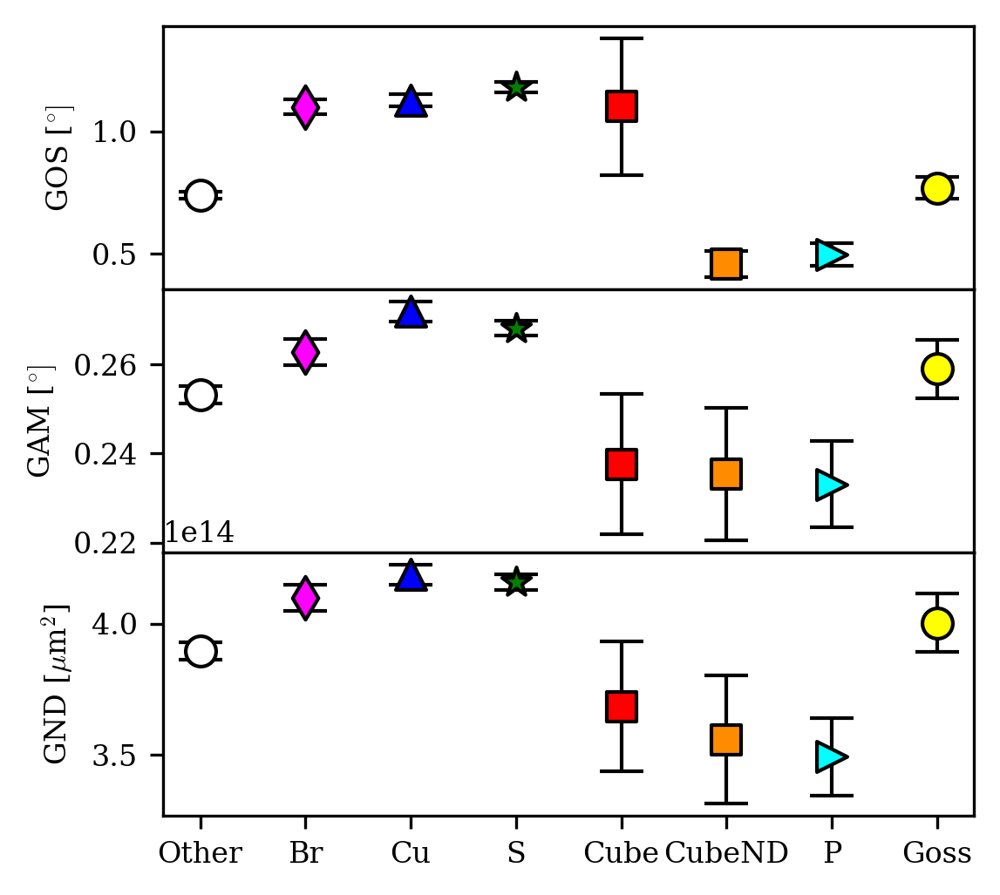

In [33]:
fs = plt.rcParams["font.size"]
plt.rcParams["font.size"] = 8

mean_gos_area_deg = np.rad2deg(mean_gos_area)
mean_gam_area_deg = np.rad2deg(mean_gam_area)
mean_gos_area_deg_confint = np.rad2deg(mean_gos_area_confint)
mean_gam_area_deg_confint = np.rad2deg(mean_gam_area_confint)

marker_kwds = dict(s=70, ec="k", clip_on=False, zorder=5)

fig, (ax0, ax1, ax2) = plt.subplots(nrows=3, ncols=1, sharex=True, figsize=(4, 4))
fig.subplots_adjust(hspace=0)
for i in range(n_ideal):
    ax0.scatter(i, mean_gos_area_deg[i], color=comp_colors[i], marker=comp_markers[i], **marker_kwds)
    ax1.scatter(i, mean_gam_area_deg[i], color=comp_colors[i], marker=comp_markers[i], **marker_kwds)
    ax2.scatter(i, mean_gnd_area[i], color=comp_colors[i], marker=comp_markers[i], **marker_kwds)
x = np.arange(n_ideal)
ax0.errorbar(x, mean_gos_area_deg, yerr=mean_gos_area_deg_confint, fmt="none", color="k", capsize=6)
ax1.errorbar(x, mean_gam_area_deg, yerr=mean_gam_area_deg_confint, fmt="none", color="k", capsize=6)
ax2.errorbar(x, mean_gnd_area, yerr=mean_gnd_area_confint, fmt="none", color="k", capsize=6)
ax0.set_ylabel(r"GOS [$^{\circ}]$")
ax1.set_ylabel(r"GAM [$^{\circ}]$")
ax2.set_ylabel(r"GND [$\mu$m$^{2}$]")
ax2.set_xticks(ideal_unique)
ax2.set_xticklabels(comp_names)

plt.rcParams["font.size"] = fs

Create figure for grain statistics

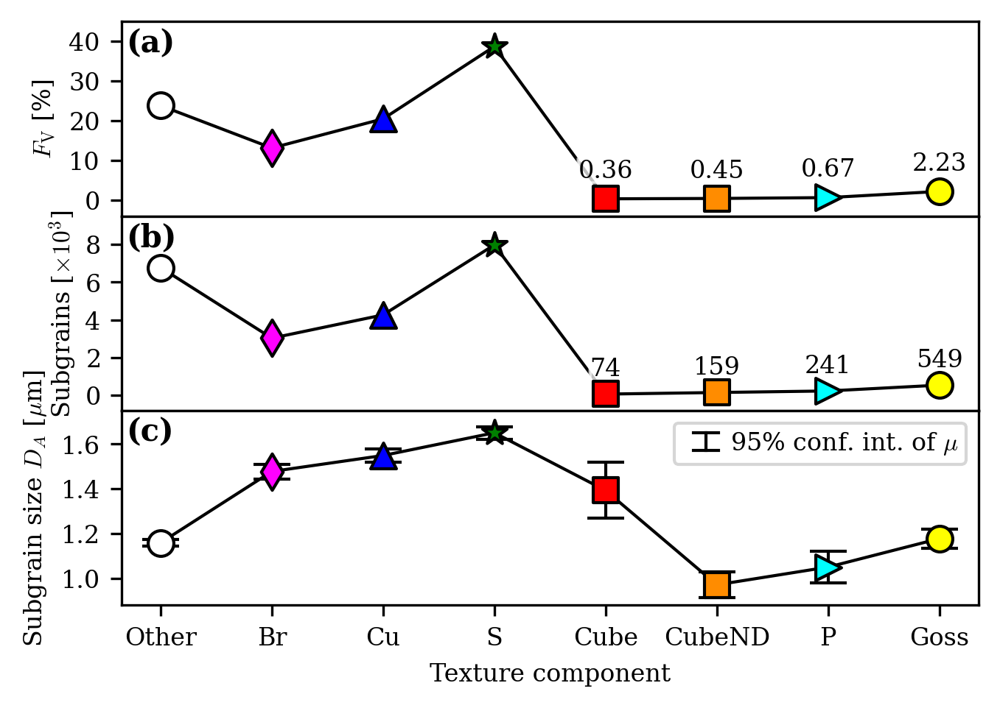

In [34]:
fs = plt.rcParams["font.size"]
plt.rcParams["font.size"] = 8

marker_kwds = dict(s=70, ec="k", clip_on=False, zorder=5)
text_kwds = dict(x=0.005, y=0.81, fontweight="bold", ha="left", va="bottom", fontsize=10)
number_kwds = dict(ha="center", va="bottom", bbox=dict(color="w", alpha=0.75, boxstyle="round,pad=0"))

fig, (ax0, ax1, ax2) = plt.subplots(3, 1, sharex=True, figsize=(5, 3.5))
fig.subplots_adjust(hspace=0)

ax0.plot(ideal_unique, 100 * fv, "k-", zorder=0)
for i in range(4, 8):
    ax0.text(i, 100 * fv[i] + 4, np.round(100 * fv[i], 2), transform=ax0.transData, **number_kwds)
for i in range(ideal_unique.size):
    ax0.scatter(i, 100 * fv[i], color=comp_colors[i], marker=comp_markers[i], **marker_kwds)

ax1.plot(ideal_unique, n_grains, "k-", zorder=0)
for i in range(4, 8):
    ax1.text(i, n_grains[i] + 700, n_grains[i], transform=ax1.transData, **number_kwds)
for i in range(ideal_unique.size):
    ax1.scatter(i, n_grains[i], color=comp_colors[i], marker=comp_markers[i], **marker_kwds)

ax2.plot(ideal_unique, mean_ecd_area, "k-", zorder=0)
for i in range(ideal_unique.size):
    ax2.scatter(i, mean_ecd_area[i], color=comp_colors[i], marker=comp_markers[i], **marker_kwds)
    ax2.errorbar(i, mean_ecd_area[i], yerr=mean_ecd_area_confint[i], fmt="none", color="k", capsize=6)
ax2.legend(
    [AnyObject()],
    ["95% conf. int. of $\mu$"],
    handler_map={AnyObject: AnyObjectHandler()},
    handletextpad=0,
    borderpad=0.3,
)

# Axes limits
ax0.set_ylim((-4, 45))
ax1_max = 9500
ax1.set_ylim((-800, ax1_max))
ax2.set_ylim((0.88, 1.75))

# Scientific axis
ax1.ticklabel_format(axis="y", style="sci", scilimits=(1, 3), useMathText=True)
ax1.get_yaxis().get_offset_text().set_visible(False)
ax_max = len(str(int(ax1_max))) - 1

# Labels
ax0.set_ylabel("$F_{\mathrm{V}}$ [%]")
ax1.set_ylabel(r"Subgrains [$\times 10^" + str(ax_max) + r"$]", labelpad=2)
ax2.set_ylabel("Subgrain size $D_A$ [$\mu$m]")
ax2.set_xlabel("Texture component")

# Subfigure labels
for ax, title in zip((ax0, ax1, ax2), ("(a)", "(b)", "(c)")):
    ax.text(s=title, transform=ax.transAxes, **text_kwds)

# Ticks
ax0.set_yticks((0, 10, 20, 30, 40))
ax1.set_yticks((0, 2000, 4000, 6000, 8000))
ax2.set_yticks((1, 1.2, 1.4, 1.6))
ax2.set_xticks(ideal_unique)
ax2.set_xticklabels(comp_names)

fig.savefig(
    os.path.join(dir_article_fig, "grain_particle_statistics", "grain_statistics.svg"),
    **savefig_kwds
)

plt.rcParams["font.size"] = fs

### Particle size

From all BSE images, not just the ROIs in the corrected EBSD maps.

In [35]:
regions_kwds = dict(
    dx=step_size["bse"] * 1e-3,
    dy=step_size["bse"] * 1e-3,
    scan_unit="um",
    background_label=0
)

Read data generated in `particle_detection.ipynb`

In [36]:
labels1 = np.load(os.path.join(dir_sample, "1/imreg/bse_full_labels_filled_filtered.npy"))
regions1 = MapRegions(label_map=labels1, **regions_kwds)

labels2 = np.load(os.path.join(dir_sample, "2/imreg/bse_full_labels_filled_filtered.npy"))
regions2 = MapRegions(label_map=labels2, **regions_kwds)

labels3 = np.load(os.path.join(dir_sample, "3/imreg/bse_full_labels_filled_filtered.npy"))
regions3 = MapRegions(label_map=labels3, **regions_kwds)

# Total area of all ROIs in microns
total_area_particles = (
    np.prod(regions1.map_shape) * regions1.dx * regions1.dy +
    np.prod(regions2.map_shape) * regions2.dx * regions2.dy +
    np.prod(regions3.map_shape) * regions3.dx * regions3.dy
)

Combine data with `pandas` into a single dataset, losing spatial information

In [37]:
area = np.hstack((regions1.area, regions2.area, regions3.area))
particles = pandas.DataFrame(data=area, columns=("area",))

particles["radius"] = np.sqrt(particles.area / np.pi)
particles["ecd"] = 0.816 * 2 * particles.radius

print(particles.size)

90345


Cumulative distribution function of particle sizes

In [38]:
ecd = particles.ecd
ecd_sorted = np.sort(ecd)
ecd_cdf = np.arange(particles.shape[0]) / particles.shape[0]

How many particles have a diameter shorter than the EBSD step size?

In [39]:
(ecd_sorted <= 0.1).sum() / ecd_sorted.size

0.9123028391167193

Area weighted histogram of particle sizes $d$

Dispersoid threshold: 0.24000 um
# EBSD pixels: 6.794101759493499 (7)


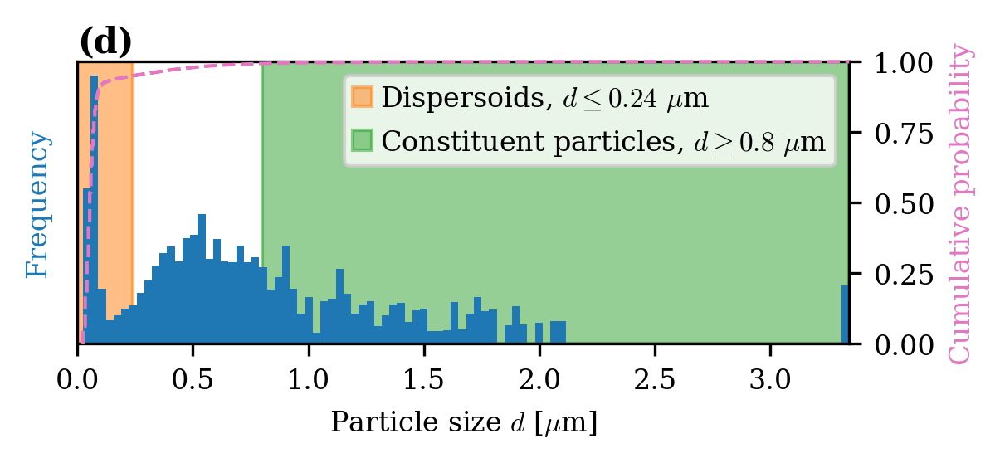

In [40]:
xmin = ecd_sorted[0]
xmax = ecd_sorted[-1]

n = np.pi * (dispersoid_threshold / (0.816 * 2 * step_size["ebsd"] * 1e-3)) ** 2
n_int = int(np.ceil(n))
print(f"Dispersoid threshold: {dispersoid_threshold:.5f} um")
print(f"# EBSD pixels: {n} ({n_int})")

fontsize = plt.rcParams["font.size"]
plt.rcParams["font.size"] = 8

# Figure
fig = plt.figure(figsize=(4, 1.5))
host = host_subplot(111, figure=fig)
par = host.twinx()
_, _, p1 = host.hist(ecd, bins=100, weights=particles.area)
p2, = par.plot(ecd_sorted, ecd_cdf, "C6--", clip_on=False, zorder=5, linewidth=1)

# Labels
host.set_xlabel(r"Particle size $d$ [$\mu$m]")
host.set_ylabel("Frequency")
par.set_ylabel("Cumulative probability")
host.yaxis.get_label().set_color(p1[0].get_facecolor())
par.yaxis.get_label().set_color(p2.get_color())

# Axes
host.set_yticks([])
par.set_ylim(0, 1)

# Regions
host.axvspan(
    xmin=0,
    xmax=dispersoid_threshold,
    color="C1",
    alpha=0.5,
    zorder=0,
    label=f"Dispersoids, $d \leq %.2f$ $\mu$m" % dispersoid_threshold,
)
host.axvspan(
    xmin=constituent_threshold,
    xmax=xmax,
    color="C2",
    alpha=0.5,
    zorder=0,
    label=f"Constituent particles, $d \geq %.1f$ $\mu$m" % constituent_threshold,
)
host.set_xlim(0, ecd.max());
host.legend(loc="upper right", handlelength=0.7, handletextpad=0.3, borderpad=0.3)

host.text(0, 1.01, "(d)", fontsize=10, fontweight="bold", ha="left", va="bottom", transform=host.transAxes)
fig.savefig(
    os.path.join(dir_article_fig, "grain_particle_statistics", "particle_size_hist.svg"),
    **savefig_kwds
)

plt.rcParams["font.size"] = fontsize

### Other particle statistics

Particle volume fraction $F_V$

$$
F_V = \frac{\sum_i^n A_i}{A_{\mathrm{total}}}.
$$

Number of particles per unit volume $N_V$

$$
N_V = \frac{3F_V}{4\pi r^3}.
$$

Number of particles crossing unit area $N_S$

$$
N_S = 2rN_v = \frac{3F_V}{2\pi r^2}.
$$

Distance to nearest neighboring particle assuming particles distributed in a grid $\lambda$

$$
\lambda = \frac{1}{\sqrt{N_S}},
$$

All

In [41]:
# Volume fraction
fv = particles.area.sum() / total_area_particles
# Area weighted particle size
ecd_all_mean = np.average(particles.ecd, weights=particles.area)
ecd_all_var = np.average((particles.ecd - ecd_all_mean) ** 2, weights=particles.area)
ecd_all_confint = 1.96 * np.sqrt(ecd_all_var) / np.sqrt(len(particles))
# Number of particles per unit volume
nv = 3 * fv / (4 * np.pi * particles.radius ** 3)
nv_mean = nv.mean()
nv_std = nv.std()
# Number of particles per unit area
ns = 2 * particles.radius * nv
ns_mean = ns.mean()
ns_std = ns.std()
# Particle distance (grid)
nn_distance_grid = 1 / np.sqrt(ns_mean)

print("All particles\n-------------")
print(f"F_V:\t\t {100 * fv:.4f}%")
print(f"d_A:\t\t {ecd_all_mean:.4f}({ecd_all_confint:.4f}) um")
print(f"N_V:\t\t {nv_mean:.4f}({nv_std:.4f}) um^-3")
print(f"N_S:\t\t {ns_mean:.4f} um^-2")
print(f"N_S^-0.5:\t {nn_distance_grid:.4f} um")

All particles
-------------
F_V:		 1.8425%
d_A:		 0.8023(0.0070) um
N_V:		 233.8844(328.4095) um^-3
N_S:		 10.6780 um^-2
N_S^-0.5:	 0.3060 um


In [42]:
constituent = particles[particles.ecd >= constituent_threshold]
dispersoids = particles[particles.ecd <= dispersoid_threshold]

Constituent particles

In [43]:
fv_c = constituent.area.sum() / total_area_particles
ecd_c_mean = np.average(constituent.ecd, weights=constituent.area)
ecd_c_var = np.average((constituent.ecd - ecd_c_mean) ** 2, weights=constituent.area)
ecd_c_confint = 1.96 * np.sqrt(ecd_c_var) / np.sqrt(len(constituent))
nv_c = 3 * fv_c / (4 * np.pi * constituent.radius ** 3)
nv_c_mean = nv_c.mean()
nv_c_std = nv_c.std()
ns_c = 2 * constituent.radius * nv_c
ns_c_mean = ns_c.mean()
ns_c_std = ns_c.std()
nn_distance_grid_c = 1 / np.sqrt(ns_c_mean)

print("Constituent particles\n---------------------")
print(f"F_V:\t\t {100 * fv_c:.4f}%")
print(f"d_A:\t\t {ecd_c_mean:.4f}({ecd_c_confint:.4f}) um")
print(f"N_V:\t\t {nv_c_mean:.4f}({nv_c_std:.4f}) um^-3")
print(f"N_S:\t\t {ns_c_mean:.4f} um^-2")
print(f"N_S^-0.5:\t {nn_distance_grid_c:.4f} um")

Constituent particles
---------------------
F_V:		 0.7291%
d_A:		 1.3999(0.0791) um
N_V:		 0.0071(0.0040) um^-3
N_S:		 0.0085 um^-2
N_S^-0.5:	 10.8519 um


Dispersoids

In [44]:
fv_d = dispersoids.area.sum() / total_area_particles
ecd_d_mean = np.average(dispersoids.ecd, weights=dispersoids.area)
ecd_d_var = np.average((dispersoids.ecd - ecd_d_mean) ** 2, weights=dispersoids.area)
ecd_d_confint = 1.96 * np.sqrt(ecd_d_var) / np.sqrt(len(dispersoids))
nv_d = 3 * fv_d / (4 * np.pi * dispersoids.radius ** 3)
nv_d_mean = nv_d.mean()
nv_d_std = nv_d.std()
ns_d = 2 * dispersoids.radius * nv_d
ns_d_mean = ns_d.mean()
ns_d_std = ns_d.std()
nn_distance_grid_d = 1 / np.sqrt(ns_d_mean)

print("Dispersoids\n-----------")
print(f"F_V:\t\t {100 * fv_d:.4f}%")
print(f"d_A:\t\t {ecd_d_mean:.4f}({ecd_d_confint:.4f}) um")
print(f"N_V:\t\t {nv_d_mean:.4f}({nv_d_std:.4f}) um^-3")
print(f"N_S:\t\t {ns_d_mean:.4f} um^-2")
print(f"N_S^-0.5:\t {nn_distance_grid_d:.4f} um")

Dispersoids
-----------
F_V:		 0.3135%
d_A:		 0.0887(0.0006) um
N_V:		 41.8751(56.5614) um^-3
N_S:		 1.9107 um^-2
N_S^-0.5:	 0.7234 um


## Figure 6. Dispersoids at subgrain boundaries

In [45]:
gb_list = []
for i in range(1, 4):
    gb_list.append(pandas.read_csv(os.path.join(dir_sample, str(i), "mtex", "grain_boundaries.txt")))

gb = pandas.concat(gb_list)
gb["dispersoids_per_length"] = gb.n_dispersoids_close / gb.length
gb["dispersoid_size_per_length"] = gb.dispersoids_close_size / gb.length
gb["at_constituent_particle"] = gb["at_constituent_particle"].astype(bool)
gb["is_al"] = gb.is_al.astype(bool)

gb_al = gb[gb.is_al].copy()

Cumulative distribution of dispersoids' distance to a boundary

In [46]:
dist_to_gb = grains[
    ~grains.is_al & (grains.ecd <= dispersoid_threshold) & (grains.dist_to_gb != -1)
].dist_to_gb
dist_to_gb_sorted = np.sort(dist_to_gb)
dist_to_gb_cdf = np.arange(dist_to_gb.size) / dist_to_gb.size

* Number of dispersoids per texture component boundary
* Size of dispersoids per texture component boundary
* Average misorientation angle per texture component
* Length of $\Sigma7$ boundary per texture component

In [47]:
disp_per_length_comp = []
disp_per_length_comp_mean = np.zeros(n_ideal)
disp_per_length_comp_var = np.zeros(n_ideal)
disp_size_comp_mean = np.zeros(n_ideal)
disp_size_comp_var = np.zeros(n_ideal)
disp_size_per_length_comp = []
disp_size_per_length_comp_mean = np.zeros(n_ideal)
disp_size_per_length_comp_var = np.zeros(n_ideal)
disp_comp = np.zeros(n_ideal)
length_comp = np.zeros(n_ideal)
length_csl3_comp = np.zeros(n_ideal)
length_csl7_comp = np.zeros(n_ideal)
n_gbs_comp = np.zeros(n_ideal)
mori_comp_mean = np.zeros(n_ideal)
mori_comp_var = np.zeros(n_ideal)

comp1 = gb_al.component1
comp2 = gb_al.component2

for i, comp_id in enumerate(ideal_unique):
    gb_al_i = gb_al[np.isin(comp1, i) | np.isin(comp2, i)]

    # Number of dispersoids per boundary
    disp_per_length_comp.append(gb_al_i.dispersoids_per_length)
    disp_per_length_comp_mean[i] = np.mean(gb_al_i.dispersoids_per_length)
    disp_per_length_comp_var[i] = np.var(gb_al_i.dispersoids_per_length)

    # Average dispersoid size per component
    disp_size_comp_i = gb_al_i.dispersoid_size_per_length * gb_al_i.length
    disp_size_comp_mean[i] = np.mean(disp_size_comp_i)
    disp_size_comp_var[i] = np.var(disp_size_comp_i)
    
    # Sum of dispersoid size per boundary
    disp_size_per_length_comp.append(gb_al_i.dispersoid_size_per_length)
    disp_size_per_length_comp_mean[i] = np.mean(gb_al_i.dispersoid_size_per_length)
    disp_size_per_length_comp_var[i] = np.var(gb_al_i.dispersoid_size_per_length)

    # Number of special boundaries
    disp_comp[i] = gb_al_i.n_dispersoids_close.sum()
    length_comp[i] = gb_al_i.length.sum()
    length_csl3_comp[i] = gb_al_i[gb_al_i.is_csl3 == 1].length.sum()
    length_csl7_comp[i] = gb_al_i[gb_al_i.is_csl7 == 1].length.sum()
    n_gbs_comp[i] = gb_al_i.size

    # Average misorientation angle
    mori_comp_mean[i] = np.mean(gb_al_i.angle)
    mori_comp_var[i] = np.var(gb_al_i.angle)
    
disp_per_length_conf_interval = 1.96 * np.sqrt(disp_per_length_comp_var) / np.sqrt(n_gbs_comp)
disp_size_per_length_conf_interval = 1.96 * np.sqrt(disp_size_per_length_comp_var) / np.sqrt(n_gbs_comp)
disp_size_conf_interval = 1.96 * np.sqrt(disp_size_comp_var) / np.sqrt(n_gbs_comp)

Average misorientation per component

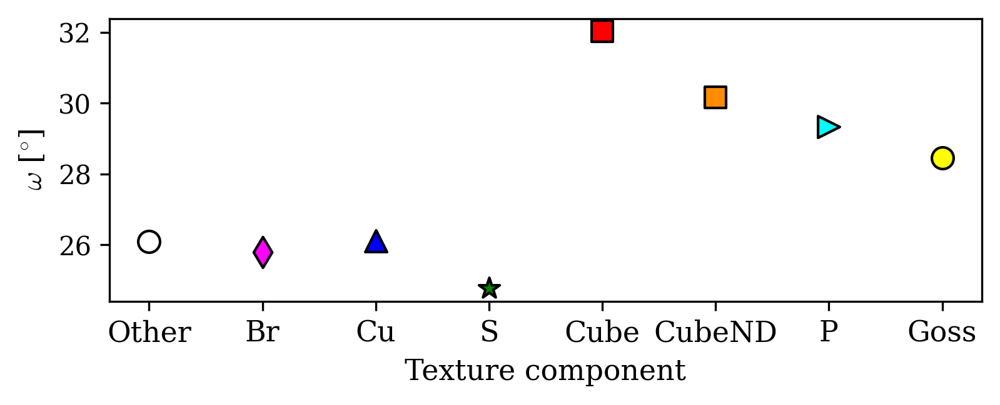

In [48]:
mori_comp_mean_deg = np.rad2deg(mori_comp_mean)

fig, ax = plt.subplots(figsize=(6, 2))
for i in range(n_ideal):
    ax.scatter(i, mori_comp_mean_deg[i], color=comp_colors[i], marker=comp_markers[i], **marker_kwds)
ax.set_xlabel("Texture component", fontsize=11)
ax.set_ylabel(r"$\omega$ [$^{\circ}$]", fontsize=11)
ax.set_xticks(ideal_unique)
ax.set_xticklabels(comp_names, fontsize=11);

Number of dispersoids per misorientation angle bin

In [49]:
# Mean
disp_per_angle_length, bin_edges, bin_num = scs.binned_statistic(
    x=gb_al.angle,
    values=gb_al.dispersoids_per_length,
    statistic="mean",
    bins=30
)
n_gbs = np.unique(bin_num, return_counts=True)[1]

# Standard deviation
disp_per_angle_length_std = scs.binned_statistic(
    x=gb_al.angle,
    values=gb_al.dispersoids_per_length,
    statistic="std",
    bins=30
)[0]

# 95% confidence interval
disp_per_angle_length_conf_int = 1.96 * disp_per_angle_length_std / np.sqrt(n_gbs)

bin_means = np.convolve(bin_edges, np.ones(2), mode="valid") / 2

# Linear regression with 95% confidence interval for intercept and slope 
res = scs.linregress(bin_means, disp_per_angle_length)
tinv = lambda conf_int, dof: abs(scs.t.ppf(conf_int / 2, dof))
ts = tinv(1 - 0.95, bin_means.size - 2)
print(f"slope (95%): {res.slope:.6f} +/- {ts * res.stderr:.6f}")

slope (95%): -0.012622 +/- 0.026660


Size of dispersoids per misorientation angle bin

In [50]:
# Mean
disp_size_per_angle_length, bin_edges_size, bin_num_size = scs.binned_statistic(
    x=gb_al.angle,
    values=gb_al.dispersoid_size_per_length,
    statistic="mean",
    bins=30
)
n_gbs_size = np.unique(bin_num_size, return_counts=True)[1]

# Standard deviation
disp_size_per_angle_length_std = scs.binned_statistic(
    x=gb_al.angle,
    values=gb_al.dispersoid_size_per_length,
    statistic="std",
    bins=30
)[0]

# 95% confidence interval
disp_size_per_angle_length_conf_int = 1.96 * disp_size_per_angle_length_std / np.sqrt(n_gbs_size)

bin_means_size = np.convolve(bin_edges_size, np.ones(2), mode="valid") / 2

# Linear regression with 95% confidence interval for intercept and slope 
res_size = scs.linregress(bin_means_size, disp_size_per_angle_length)
tinv_size = lambda conf_int, dof: abs(scs.t.ppf(conf_int / 2, dof))
ts_size = tinv(1 - 0.95, bin_means_size.size - 2)
print(f"slope (95%): {res_size.slope:.6f} +/- {ts_size * res_size.stderr:.6f}")

slope (95%): 0.004709 +/- 0.003892


Plots of:
* Dispersoid distance to boundary
* Number of dispersoids per boundary length as a function of
    * boundary misorientation angle
    * texture component
* Dispersoid size per boundary length as a function of
    * boundary misorientation angle
    * texture component

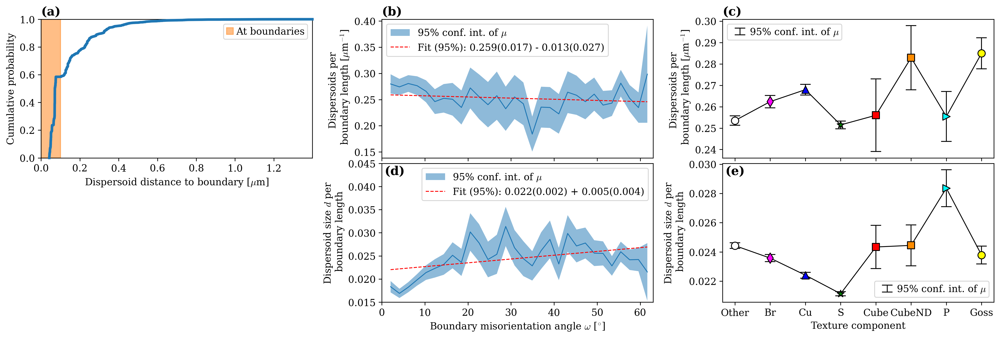

In [51]:
font_size = plt.rcParams["font.size"]
plt.rcParams["font.size"] = 11

fig, ax = plt.subplots(figsize=(16, 5.5), ncols=3, nrows=2)

# Number of dispersoids per distance bin
ax[0, 0].plot(dist_to_gb_sorted, dist_to_gb_cdf, "-", linewidth=3, clip_on=False, zorder=5)
ax[0, 0].set_xlabel(r"Dispersoid distance to boundary [$\mu$m]")
ax[0, 0].set_ylabel("Cumulative probability")
ax[0, 0].axvspan(xmin=0, xmax=0.1, color="C1", alpha=0.5, zorder=0, label="At boundaries")
ax[0, 0].legend(handlelength=0.7, handletextpad=0.3, borderpad=0.3)

# Number of dispersoids per misorientation angle bin
bin_means_deg = np.degrees(bin_means)
ax[0, 1].fill_between(
    bin_means_deg,
    disp_per_angle_length - disp_per_angle_length_conf_int,
    disp_per_angle_length + disp_per_angle_length_conf_int,
    alpha=0.5,
    label="95% conf. int. of $\mu$",
)
ax[0, 1].plot(bin_means_deg, disp_per_angle_length, "C0-")
ax[0, 1].plot(
    bin_means_deg,
    res.intercept + res.slope * bin_means,
    "r--",
    label=f"Fit (95%): {res.intercept:.3f}({ts * res.intercept_stderr:.3f}) - {-res.slope:.3f}({ts * res.stderr:.3f})"
)
ax[0, 1].set_ylabel("Dispersoids per \n boundary length [$\mu$m$^{-1}$]")
ax[0, 1].legend(loc="upper left")

# Number of dispersoids per texture component boundary
ax[0, 2].plot(ideal_unique, disp_per_length_comp_mean, "k-")
for i in range(ideal_unique.size):
    ax[0, 2].scatter(i, disp_per_length_comp_mean[i], color=comp_colors[i], marker=comp_markers[i], **marker_kwds)
    ax[0, 2].errorbar(i, disp_per_length_comp_mean[i], yerr=disp_per_length_conf_interval[i], fmt="none", color="k", capsize=6)
        
ax[0, 2].set_ylabel("Dispersoids per \n boundary length [$\mu$m$^{-1}$]")
ax[0, 2].legend(
    [AnyObject()],
    ["95% conf. int. of $\mu$"],
    handler_map={AnyObject: AnyObjectHandler()},
    handletextpad=0,
    borderpad=0.3,
    loc="upper left",
)

# Dispersoid size per texture component boundary
bin_means_size_deg = np.rad2deg(bin_means_size)
ax[1, 1].fill_between(
    bin_means_size_deg,
    disp_size_per_angle_length - disp_size_per_angle_length_conf_int,
    disp_size_per_angle_length + disp_size_per_angle_length_conf_int,
    alpha=0.5,
    label="95% conf. int. of $\mu$",
)
ax[1, 1].plot(bin_means_size_deg, disp_size_per_angle_length, "C0-")
ax[1, 1].plot(
    bin_means_size_deg,
    res_size.intercept + res_size.slope * bin_means_size,
    "r--",
    label=(
        f"Fit (95%): {res_size.intercept:.3f}({ts_size * res_size.intercept_stderr:.3f}) + {res_size.slope:.3f}({ts_size * res_size.stderr:.3f})"
    )
)
ax[1, 1].set_xlabel(r"Boundary misorientation angle $\omega$ [$^{\circ}$]")
ax[1, 1].set_ylabel("Dispersoid size $d$ per \n boundary length")
ax[1, 1].legend()

# Dispersoid size per texture component boundary
ax[1, 2].plot(ideal_unique, disp_size_per_length_comp_mean, "k-")
for i in range(ideal_unique.size):
    ax[1, 2].scatter(i, disp_size_per_length_comp_mean[i], color=comp_colors[i], marker=comp_markers[i], **marker_kwds)
    ax[1, 2].errorbar(i, disp_size_per_length_comp_mean[i], yerr=disp_size_per_length_conf_interval[i], fmt="none", color="k", capsize=6)
        
ax[1, 2].set_xlabel("Texture component")
ax[1, 2].set_ylabel("Dispersoid size $d$ per \n boundary length")
ax[1, 2].legend(
    [AnyObject()],
    ["95% conf. int. of $\mu$"],
    handler_map={AnyObject: AnyObjectHandler()},
    handletextpad=0,
    borderpad=0.3,
    loc="lower right",
)

# Ticks
ax[0, 2].set_xticks(ideal_unique)
ax[1, 2].set_xticks(ideal_unique)
ax[1, 2].set_xticklabels(comp_names)
 
# Axes limits
ax[0, 0].set_ylim(0, 1)
ax[0, 0].set_xlim((0, dist_to_gb_sorted.max()))
ax[0, 1].set_xlim(0, 63)
ax[1, 1].set_xlim(0, 63)
ax[1, 1].set_ylim((0.015, 0.045))

# Hide axis
ax[1, 0].set_visible(False)

# Subfigure labels
label_kwds = dict(fontweight="bold", ha="left", va="bottom", fontsize=14)
for idx, label in zip([(0, 0), (0, 1), (0, 2)], ["(a)", "(b)", "(c)"]):
    ax[idx].text(0, 1.01, label, transform=ax[idx].transAxes, **label_kwds)
for idx, label in zip([(1, 1), (1, 2)], ["(d)", "(e)"]):
    ax[idx].text(0.01, 0.9, label, transform=ax[idx].transAxes, **label_kwds)

# Sharing axes
ax[0, 1].set_xticklabels([])
ax[0, 2].set_xticklabels([])

fig.tight_layout(h_pad=-2.5)
fig.savefig(
    os.path.join(
        dir_article_fig,
        "dispersoids_at_boundaries",
        f"dispersoids_at_boundaries_all.svg"
    ),
    **savefig_kwds
)

plt.rcParams["font.size"] = font_size

Number of dispersoids per boundary length on average

In [52]:
gb_al.dispersoids_per_length.mean()

0.26083962231490615

Dispersoid size per boundary length on average

In [53]:
gb_al.dispersoid_size_per_length.mean()

0.02223541341271045

### High-angle subgrain boundary

Number of dispersoids per boundary length and dispersoid size per boundary
length of HAGB by constituent particles compared to elsewhere

In [54]:
gb_hagb_constituent = gb_al[gb_al.at_constituent_particle & (gb_al.angle >= np.deg2rad(15))]
gb_hagb_elsewhere = gb_al[~gb_al.at_constituent_particle & (gb_al.angle >= np.deg2rad(15))]

disp_per_length_hagb_constituent = gb_hagb_constituent.dispersoids_per_length
disp_per_length_hagb_elsewhere = gb_hagb_elsewhere.dispersoids_per_length
disp_size_per_length_hagb_constituent = gb_hagb_constituent.dispersoid_size_per_length
disp_size_per_length_hagb_elsewhere = gb_hagb_elsewhere.dispersoid_size_per_length

# Mean
disp_per_length_constituent_mean = disp_per_length_hagb_constituent.mean()
disp_per_length_elsewhere_mean = disp_per_length_hagb_elsewhere.mean()
disp_size_per_length_constituent_mean = disp_size_per_length_hagb_constituent.mean()
disp_size_per_length_elsewhere_mean = disp_size_per_length_hagb_elsewhere.mean()

# Standard deviation
disp_per_length_constituent_std = np.std(disp_per_length_hagb_constituent)
disp_per_length_elsewhere_std = np.std(disp_per_length_hagb_elsewhere)
disp_size_per_length_constituent_std = np.std(disp_size_per_length_hagb_constituent)
disp_size_per_length_elsewhere_std = np.std(disp_size_per_length_hagb_elsewhere)

# 95% confidence interval
disp_per_length_constituent_ci = 1.96 * disp_per_length_constituent_std / np.sqrt(disp_per_length_hagb_constituent.size)
disp_per_length_elsewhere_ci = 1.96 * disp_per_length_elsewhere_std / np.sqrt(disp_per_length_hagb_elsewhere.size)
disp_size_per_length_constituent_ci = 1.96 * disp_size_per_length_constituent_std / np.sqrt(disp_size_per_length_hagb_constituent.size)
disp_size_per_length_elsewhere_ci = 1.96 * disp_size_per_length_elsewhere_std / np.sqrt(disp_size_per_length_hagb_elsewhere.size)

print(
    "Dispersoids per length, per HAGB class",
    "\n--------------------------------------",
    f"\nAt constituent particle ({gb_hagb_constituent.n_dispersoids_close.sum()} / {gb_hagb_constituent.length.sum():.1f} um)"
    f":\t{disp_per_length_constituent_mean:.3f}({disp_per_length_constituent_ci:.3f}) dispersoids/um",
    f"\nElsewhere ({gb_hagb_elsewhere.n_dispersoids_close.sum()} / {gb_hagb_elsewhere.length.sum():.1f} um)"
    f":\t\t\t{disp_per_length_elsewhere_mean:.3f}({disp_per_length_elsewhere_ci:.3f}) dispersoids/um",
)
print(
    "\nDispersoid size per length, per HAGB class",
    "\n------------------------------------------",
    f"\nAt constituent particle ({gb_hagb_constituent.dispersoids_close_size.sum():.3f} um / {gb_hagb_constituent.length.sum():.1f} um)"
    f":\t{disp_size_per_length_constituent_mean:.5f}({disp_size_per_length_constituent_ci:.5f})",
    f"\nElsewhere ({gb_hagb_elsewhere.dispersoids_close_size.sum():.3f} um / {gb_hagb_elsewhere.length.sum():.1f} um)"
    f":\t\t{disp_size_per_length_elsewhere_mean:.5f}({disp_size_per_length_elsewhere_ci:.5f})",
)

Dispersoids per length, per HAGB class 
-------------------------------------- 
At constituent particle (61 / 263.3 um):	0.239(0.060) dispersoids/um 
Elsewhere (4671 / 19195.1 um):			0.248(0.007) dispersoids/um

Dispersoid size per length, per HAGB class 
------------------------------------------ 
At constituent particle (6.078 um / 263.3 um):	0.02227(0.00583) 
Elsewhere (503.266 um / 19195.1 um):		0.02561(0.00066)


### $\Sigma7$

Number of dispersoids per boundary length and dispersoid size per boundary
length of $\Sigma7$ boundaries compared to all other boundaries

In [55]:
gb_csl7 = gb_al[gb_al.is_csl7 == 1]
gb_not_csl7 = gb_al[gb_al.is_csl7 != 1]

disp_per_length_csl7 = gb_csl7.dispersoids_per_length
disp_per_length_not_csl7 = gb_not_csl7.dispersoids_per_length
disp_size_per_length_csl7 = gb_csl7.dispersoid_size_per_length
disp_size_per_length_not_csl7 = gb_not_csl7.dispersoid_size_per_length

# Mean
disp_per_length_csl7_mean = disp_per_length_csl7.mean()
disp_per_length_not_csl7_mean = disp_per_length_not_csl7.mean()
disp_size_per_length_csl7_mean = disp_size_per_length_csl7.mean()
disp_size_per_length_not_csl7_mean = disp_size_per_length_not_csl7.mean()

# Standard deviation
disp_per_length_csl7_std = np.std(disp_per_length_csl7)
disp_per_length_not_csl7_std = np.std(disp_per_length_not_csl7)
disp_size_per_length_csl7_std = np.std(disp_size_per_length_csl7)
disp_size_per_length_not_csl7_std = np.std(disp_size_per_length_not_csl7)

# 95% confidence interval
disp_per_length_csl7_ci = 1.96 * disp_per_length_csl7_std / np.sqrt(disp_per_length_csl7.size)
disp_per_length_not_csl7_ci = 1.96 * disp_per_length_not_csl7_std / np.sqrt(disp_per_length_not_csl7.size)
disp_size_per_length_csl7_ci = 1.96 * disp_size_per_length_csl7_std / np.sqrt(disp_size_per_length_csl7.size)
disp_size_per_length_not_csl7_ci = 1.96 * disp_size_per_length_not_csl7_std / np.sqrt(disp_size_per_length_not_csl7.size)

print(
    "Dispersoids per length",
    "\n----------------------",
    f"\n38 deg <111> ({gb_csl7.n_dispersoids_close.sum()} / {gb_csl7.length.sum():.1f} um)"
    f":\t{disp_per_length_csl7_mean:.3f}({disp_per_length_csl7_ci:.3f}) dispersoids/um",
    f"\nElsewhere ({gb_not_csl7.n_dispersoids_close.sum()} / {gb_not_csl7.length.sum():.1f} um)"
    f":\t{disp_per_length_not_csl7_mean:.3f}({disp_per_length_not_csl7_ci:.3f}) dispersoids/um",
)
print(
    "\nDispersoid size per length",
    "\n--------------------------",
    f"\n38 deg <111> ({gb_csl7.dispersoids_close_size.sum():.3f} um / {gb_csl7.length.sum():.1f} um)"
    f":\t{disp_size_per_length_csl7_mean:.5f}({disp_size_per_length_csl7_ci:.5f})",
    f"\nElsewhere ({gb_not_csl7.dispersoids_close_size.sum():.3f} um / {gb_not_csl7.length.sum():.1f} um)"
    f":\t{disp_size_per_length_not_csl7_mean:.5f}({disp_size_per_length_not_csl7_ci:.5f})",
)

Dispersoids per length 
---------------------- 
38 deg <111> (709 / 3107.9 um):	0.233(0.017) dispersoids/um 
Elsewhere (9626 / 37400.0 um):	0.263(0.005) dispersoids/um

Dispersoid size per length 
-------------------------- 
38 deg <111> (81.781 um / 3107.9 um):	0.02563(0.00170) 
Elsewhere (844.465 um / 37400.0 um):	0.02196(0.00042)


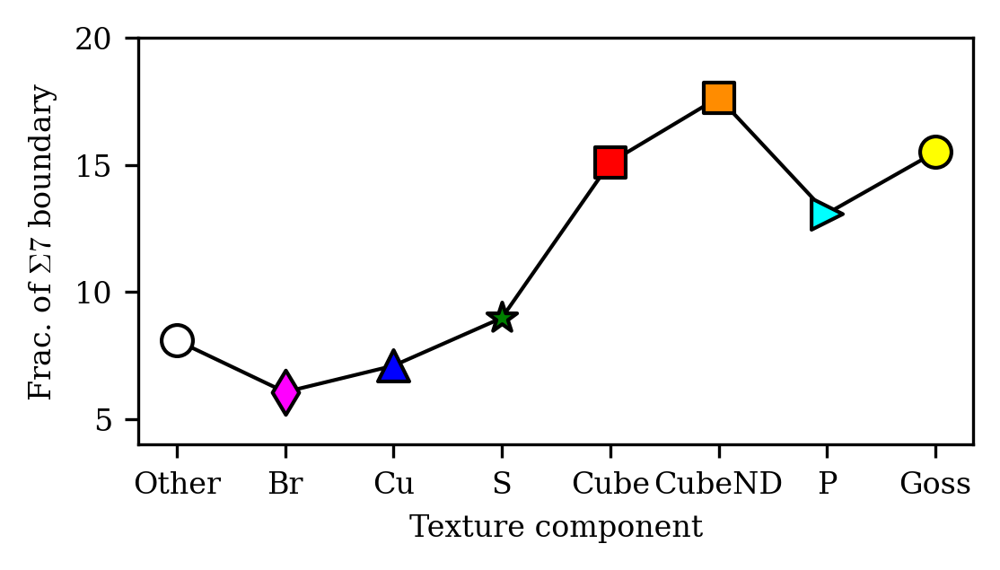

In [56]:
fs = plt.rcParams["font.size"]
plt.rcParams["font.size"] = 8

marker_kwds = dict(s=70, ec="k", clip_on=False, zorder=5)

fig, ax = plt.subplots(figsize=(4, 2))
for i in range(n_ideal):
    ax.scatter(i, 100 * length_csl7_comp[i] / length_comp[i], color=comp_colors[i], marker=comp_markers[i], **marker_kwds)
ax.plot(100 * length_csl7_comp / length_comp, "k-")
ax.set_ylabel(r"Frac. of $\Sigma7$ boundary")
ax.set_xlabel("Texture component")
ax.set_xticks(ideal_unique)
ax.set_xticklabels(comp_names)
ax.set_ylim((4, 20))

plt.rcParams["font.size"] = fs

In [57]:
for i in range(n_ideal):
    print(f"{comp_names[i]}: {100 * length_csl7_comp[i] / length_comp[i]:.1f}")

Other: 8.1
Br: 6.1
Cu: 7.1
S: 9.0
Cube: 15.1
CubeND: 17.7
P: 13.1
Goss: 15.5


## $\Sigma3$

Number of dispersoids per boundary length and dispersoid size per boundary
length of $\Sigma3$ boundaries compared to all other boundaries

In [58]:
gb_csl3 = gb_al[gb_al.is_csl3 == 1]
gb_not_csl3 = gb_al[gb_al.is_csl3 != 1]

disp_per_length_csl3 = gb_csl3.dispersoids_per_length
disp_per_length_not_csl3 = gb_not_csl3.dispersoids_per_length
disp_size_per_length_csl3 = gb_csl3.dispersoid_size_per_length
disp_size_per_length_not_csl3 = gb_not_csl3.dispersoid_size_per_length

# Mean
disp_per_length_csl3_mean = disp_per_length_csl3.mean()
disp_per_length_not_csl3_mean = disp_per_length_not_csl3.mean()
disp_size_per_length_csl3_mean = disp_size_per_length_csl3.mean()
disp_size_per_length_not_csl3_mean = disp_size_per_length_not_csl3.mean()

# Standard deviation
disp_per_length_csl3_std = np.std(disp_per_length_csl3)
disp_per_length_not_csl3_std = np.std(disp_per_length_not_csl3)
disp_size_per_length_csl3_std = np.std(disp_size_per_length_csl3)
disp_size_per_length_not_csl3_std = np.std(disp_size_per_length_not_csl3)

# 95% confidence interval
disp_per_length_csl3_ci = 1.96 * disp_per_length_csl3_std / np.sqrt(disp_per_length_csl3.size)
disp_per_length_not_csl3_ci = 1.96 * disp_per_length_not_csl3_std / np.sqrt(disp_per_length_not_csl3.size)
disp_size_per_length_csl3_ci = 1.96 * disp_size_per_length_csl3_std / np.sqrt(disp_size_per_length_csl3.size)
disp_size_per_length_not_csl3_ci = 1.96 * disp_size_per_length_not_csl3_std / np.sqrt(disp_size_per_length_not_csl3.size)

print(
    "Dispersoids per length",
    "\n----------------------",
    f"\n60 deg <111> ({gb_csl3.n_dispersoids_close.sum()} / {gb_csl3.length.sum():.1f} um)"
    f":\t{disp_per_length_csl3_mean:.3f}({disp_per_length_csl3_ci:.3f}) dispersoids/um",
    f"\nElsewhere ({gb_not_csl3.n_dispersoids_close.sum()} / {gb_not_csl3.length.sum():.1f} um)"
    f":\t{disp_per_length_not_csl3_mean:.3f}({disp_per_length_not_csl3_ci:.3f}) dispersoids/um",
)
print(
    "\nDispersoid size per length",
    "\n--------------------------",
    f"\n60 deg <111> ({gb_csl3.dispersoids_close_size.sum():.3f} um / {gb_csl3.length.sum():.1f} um)"
    f":\t{disp_size_per_length_csl3_mean:.5f}({disp_size_per_length_csl3_ci:.5f})",
    f"\nElsewhere ({gb_not_csl3.dispersoids_close_size.sum():.3f} um / {gb_not_csl3.length.sum():.1f} um)"
    f":\t{disp_size_per_length_not_csl3_mean:.5f}({disp_size_per_length_not_csl3_ci:.5f})",
)

Dispersoids per length 
---------------------- 
60 deg <111> (838 / 3325.8 um):	0.257(0.018) dispersoids/um 
Elsewhere (9497 / 37182.1 um):	0.261(0.005) dispersoids/um

Dispersoid size per length 
-------------------------- 
60 deg <111> (86.358 um / 3325.8 um):	0.02519(0.00154) 
Elsewhere (839.888 um / 37182.1 um):	0.02197(0.00043)


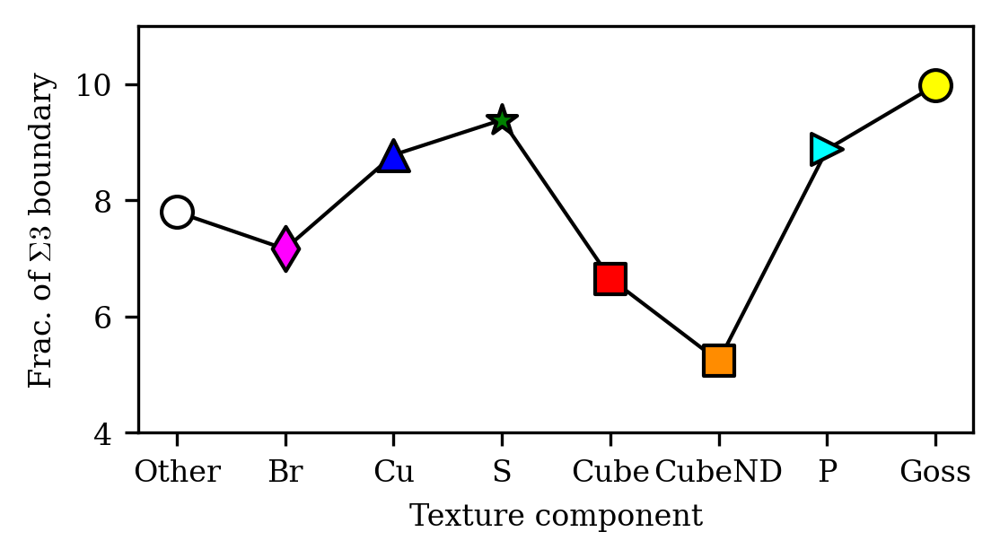

In [59]:
fs = plt.rcParams["font.size"]
plt.rcParams["font.size"] = 8

marker_kwds = dict(s=70, ec="k", clip_on=False, zorder=5)

fig, ax = plt.subplots(figsize=(4, 2))
for i in range(n_ideal):
    ax.scatter(i, 100 *length_csl3_comp[i] / length_comp[i], color=comp_colors[i], marker=comp_markers[i], **marker_kwds)
ax.plot(100 * length_csl3_comp / length_comp, "k-")
ax.set_ylabel(r"Frac. of $\Sigma3$ boundary")
ax.set_xlabel("Texture component")
ax.set_xticks(ideal_unique)
ax.set_xticklabels(comp_names)
ax.set_ylim((4, 11))

plt.rcParams["font.size"] = fs

In [60]:
for i in range(n_ideal):
    print(f"{comp_names[i]}: {100 * length_csl3_comp[i] / length_comp[i]:.1f}")

Other: 7.8
Br: 7.2
Cu: 8.8
S: 9.4
Cube: 6.7
CubeND: 5.2
P: 8.9
Goss: 10.0


## Figure 7. Subgrains at constituent particles

Neighbor IDs

In [61]:
# 1
neighbors1 = np.loadtxt(os.path.join(dir_sample, "1/mtex/grain_neighbors.txt"), unpack=True, delimiter=",").astype(int)

# 2
neighbors2 = np.loadtxt(os.path.join(dir_sample, "2/mtex/grain_neighbors.txt"), unpack=True, delimiter=",").astype(int)
neighbors2 += n_grains1

# 3
neighbors3 = np.loadtxt(os.path.join(dir_sample, "3/mtex/grain_neighbors.txt"), unpack=True, delimiter=",").astype(int)
neighbors3 += n_grains1 + n_grains2

# Combined
neighbors = np.column_stack((neighbors1, neighbors2, neighbors3))

Number of grains by constituent particles and their sizes

In [62]:
n_at_constituent = np.zeros(ideal_unique.size, dtype=int)
ecd_area_at_constituent = np.zeros(ideal_unique.size)

# Grain IDs
ids_al = grains_al["#id"]
ids_constituent = grains[(~grains.is_al) & (grains.particle_ecd >= constituent_threshold)]["#id"]

# Grain IDs of neighbors of constituent particles
mask = np.isin(neighbors, ids_constituent)
mask2 = np.any(mask, axis=0)  # Any of the two grain neighbors
neighboring_grain_ids = np.unique(neighbors[:, mask2])

# Per component
for i, comp_id in enumerate(ideal_unique):
    grain_ids = grains_al[grains_al.ideal == comp_id]["#id"]
    mask_i = np.isin(grain_ids, neighboring_grain_ids)
    mask_ii = np.isin(ids_al, grain_ids[mask_i])

    grains_ecd_i = grains_al[mask_ii].ecd
    area_i = grains_al[mask_ii].area

    n_at_constituent[i] = mask_i.sum()
    ecd_area_at_constituent[i] = np.average(grains_ecd_i, weights=area_i)

Number of grains considered constituent particles

In [63]:
ids_constituent.size

104

GOS, GAM and GND

In [64]:
grains_at_constituent = grains_al[np.isin(ids_al, neighboring_grain_ids)]
grains_elsewhere = grains_al[~np.isin(ids_al, neighboring_grain_ids)]

# GOS
gos_at_constituent = np.rad2deg(grains_at_constituent.gos)
gos_elsewhere = np.rad2deg(grains_elsewhere.gos)

# GAM
gam_at_constituent = np.rad2deg(grains_at_constituent.gam)
gam_elsewhere = np.rad2deg(grains_elsewhere.gam)

# GND
gnd_at_constituent = grains_at_constituent.gnd
gnd_elsewhere = grains_elsewhere.gnd

Misorientation angles

In [65]:
fname_constituent = "gb_at_constituent_mori_angles.txt"
fname_elsewhere = "gb_not_at_constituent_mori_angles.txt"

mangle_at_constituent_list = []
mangle_elsewhere_list = []
for i in range(1, 4):
    dir_i = os.path.join(dir_sample, str(i), "mtex")
    mangle_constituent_i = np.loadtxt(os.path.join(dir_i, fname_constituent))
    mangle_else_i = np.loadtxt(os.path.join(dir_i, fname_elsewhere))
    mangle_at_constituent_list.append(mangle_constituent_i)
    mangle_elsewhere_list.append(mangle_else_i)

mangle_at_constituent = np.rad2deg(np.concatenate(mangle_at_constituent_list))
mangle_elsewhere = np.rad2deg(np.concatenate(mangle_elsewhere_list))

Figures

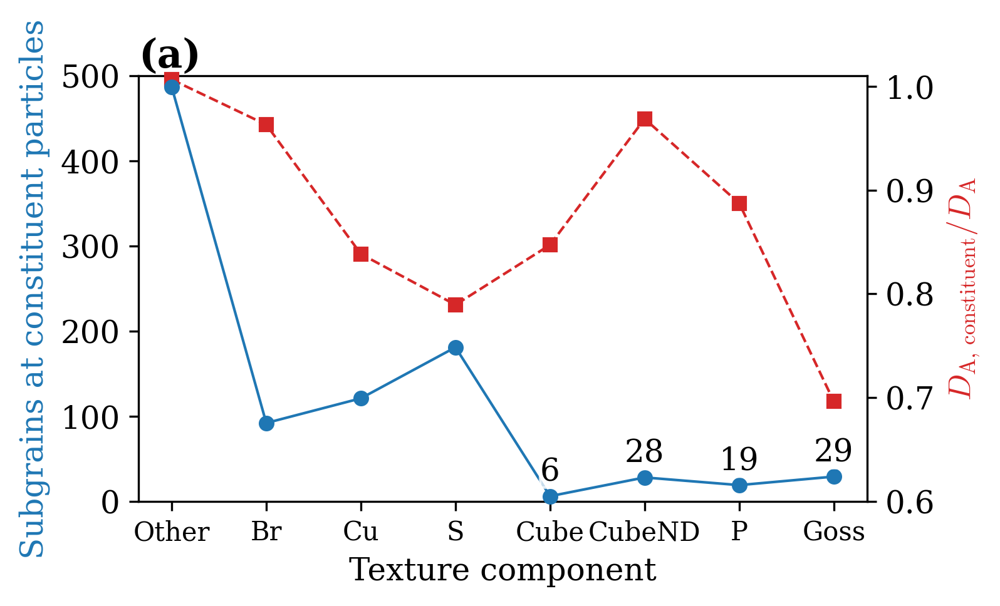

In [66]:
font_size = plt.rcParams["font.size"]
plt.rcParams["font.size"] = 12

text_kwds = dict(x=0.005, y=0.81, fontweight="bold", ha="left", va="bottom", fontsize=10)
number_kwds = dict(ha="center", va="bottom", zorder=10, bbox=dict(color="w", alpha=0.75, boxstyle="round,pad=0"))

fig = plt.figure(figsize=(5, 3))
host = host_subplot(111, figure=fig)
par = host.twinx()
p1, = host.plot(
    ideal_unique,
    n_at_constituent,
    "C0-o",
    clip_on=False,
    zorder=5,
)
for i in range(4, 8):
    host.text(i, n_at_constituent[i] + 10, n_at_constituent[i], transform=host.transData, **number_kwds)
par_label = "$D_{\mathrm{A,\:constituent}} / D_{\mathrm{A}}$"
p2, = par.plot(
    ideal_unique,
    ecd_area_at_constituent / mean_ecd_area,
    "C3--s",
    clip_on=False,
    zorder=4,
    label=par_label
)

# Axes limits
host.set_ylim(0, 500)
par.set_ylim(0.6, 1.01)

# Labels
host.set_xlabel("Texture component")
host.set_ylabel("Subgrains at constituent particles")
par.set_ylabel(par_label)
host.yaxis.get_label().set_color(p1.get_color())
par.yaxis.get_label().set_color(p2.get_color())

# Subfigure labels
host.text(0, 1, "(a)", fontweight="bold", fontsize=15, ha="left", va="bottom", transform=host.transAxes)

# Ticks
host.set_xticks(ideal_unique)
host.set_xticklabels(comp_names, fontsize=10)
par.set_yticks([0.6, 0.7, 0.8, 0.9, 1])

fig.savefig(os.path.join(dir_article_fig, "grains_at_constituent_particles", "n_grains_grain_size.svg"), **savefig_kwds)

plt.rcParams["font.size"] = font_size

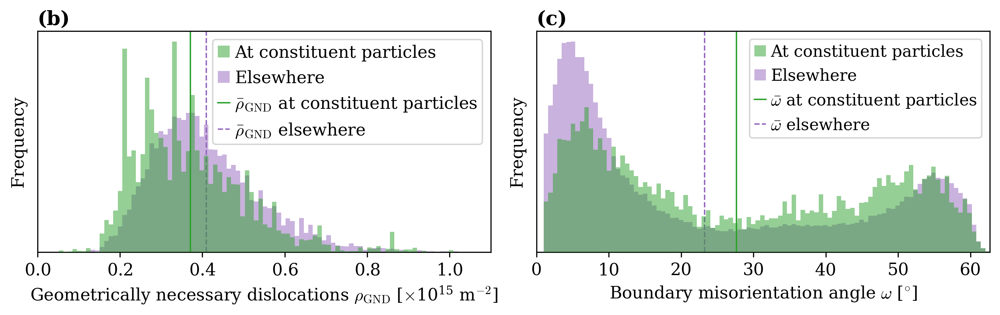

In [67]:
font_size = plt.rcParams["font.size"]
plt.rcParams["font.size"] = 12

# Local colors
c0 = "C2"
c1 = "C4"

# X limits
gnd_min = min((gnd_elsewhere.min(), gnd_at_constituent.min()))
gnd_max = max((gnd_elsewhere.max(), gnd_at_constituent.max()))
bins = np.linspace(gnd_min, gnd_max, 200)

fig, (ax0, ax1) = plt.subplots(ncols=2, figsize=(10, 3.25))
ax0.hist(
    gnd_at_constituent,
    bins,
    weights=grains_at_constituent.area,
    density=True,
    alpha=0.5,
    label="At constituent particles",
    zorder=5,
    color=c0,
);
ax0.hist(
    gnd_elsewhere,
    bins,
    weights=grains_elsewhere.area,
    density=True,
    alpha=0.5,
    label="Elsewhere",
    color=c1,
);

# Mean lines
gnd_constituent_isnan = np.isnan(gnd_at_constituent)
gnd_elsewhere_isnan = np.isnan(gnd_elsewhere)
ax0.axvline(
    x=np.average(gnd_at_constituent[~gnd_constituent_isnan], weights=grains_at_constituent[~gnd_constituent_isnan].area),
    c=c0,
    label=r"$\bar{\rho}_{\mathrm{GND}}$ at constituent particles"
)
ax0.axvline(
    x=np.average(gnd_elsewhere[~gnd_elsewhere_isnan], weights=grains_elsewhere[~gnd_elsewhere_isnan].area),
    c=c1,
    linestyle="--",
    label=r"$\bar{\rho}_{\mathrm{GND}}$ elsewhere",
)

ax0.set_ylabel("Frequency")
ax0.set_yticks([])
ax0.set_xlim((gnd_min, 1.1e15))
ax0.ticklabel_format(useMathText=True)
ax0.legend(handlelength=0.7, handletextpad=0.3, borderpad=0.3, fontsize=12)

# ---------- Misorientation angle distributions
vmin = min((mangle_at_constituent.min(), mangle_at_constituent.min()))
vmax = max((mangle_elsewhere.max(), mangle_elsewhere.max()))

bins = np.linspace(vmin, vmax, 100)

ax1.hist(
    mangle_at_constituent,
    bins=bins,
    density=True,
    alpha=0.5,
    color=c0,
    label="At constituent particles",
    zorder=5,
);
ax1.hist(
    mangle_elsewhere,
    bins=bins,
    density=True,
    alpha=0.5,
    color=c1,
    label="Elsewhere"
);
ax0.set_xlim(0)
ax1.set_xlim((0, vmax))
ax1.set_xlabel(r"Boundary misorientation angle $\omega$ [$^{\circ}$]")
ax1.set_ylabel("Frequency")
ax1.set_yticks([])

# Mean lines
ax1.axvline(x=mangle_at_constituent.mean(), c=c0, label=r"$\bar{\omega}$ at constituent particles")
ax1.axvline(x=mangle_elsewhere.mean(), c=c1, linestyle="--", label=r"$\bar{\omega}}$ elsewhere")

ax1.legend(handlelength=0.7, handletextpad=0.3, borderpad=0.3, fontsize=11.5)

# ---------- Subplot labels
label_kwds = dict(fontweight="bold", ha="left", va="bottom", fontsize=14)
ax0.text(0, 1.01, "(b)", transform=ax0.transAxes, **label_kwds)
ax1.text(0, 1.01, "(c)", transform=ax1.transAxes, **label_kwds)

fig.tight_layout()

# Place scientific exponent someplace else (has to be after tight_layout() call)
ax0.get_xaxis().get_offset_text().set_visible(False)
exp = ax0.get_xaxis().get_offset_text().get_text()
ax0.set_xlabel(r"Geometrically necessary dislocations $\rho_{\mathrm{GND}}$ [" + exp + r" m$^{-2}$]")

fig.savefig(
    os.path.join(dir_article_fig, "grains_at_constituent_particles", "gnd_misori_angles.svg"), **savefig_kwds
)

plt.rcParams["font.size"] = font_size

## Smith-Zener drag $P_{\mathrm{sb}}'$

From the Smith-Zener drag on subgrain boundaries by Hutchinson and Duggan $P_{\mathrm{sb}}$ to the
drag on subgrain boundaries per texture component

$$
P_{\mathrm{sb}}' = \frac{3\gamma f_V}{Ad^2} = \frac{\gamma f_V D_A}{d^2} = \frac{\gamma f_L D_A}{2d} \propto \frac{f_L D_A}{d},
$$

* $\gamma$, subgrain boundary energy [$J/m^2$]
* $f_{\mathrm{V}}$, average volume fraction of dispersoids [-]
* $D_A$, area weighted average subgrain size per texture component [$m$]
* $A = 3 / L$, area of subgrain boundary per unit volume, per texture component [$m^{-1}$]
* $L$, average boundary length per subgrain, per texture component [$m$]
* $d$, average dispersoids diameter, per texture component
* $f_{\mathrm{L}} \approx 2f_{\mathrm{V}} / d$, average number of dispersoids, per texture component [$m^{-1}$]

In [68]:
f_L = disp_per_length_comp_mean
D_A = mean_ecd_area
d_average = disp_size_comp_mean
p_sz_prop = f_L * D_A / d_average

Error propagation in $P_{sb}'$ assuming no error in average values for $L$ and $d$

In [69]:
f_L_delta = disp_per_length_conf_interval
D_A_delta = mean_ecd_area_confint
d_average_delta = disp_size_conf_interval
p_delta = p_sz_prop * np.sqrt(
    (f_L_delta / f_L) ** 2
    + (D_A_delta / D_A) ** 2
    + (-d_average_delta / d_average) ** 2
)

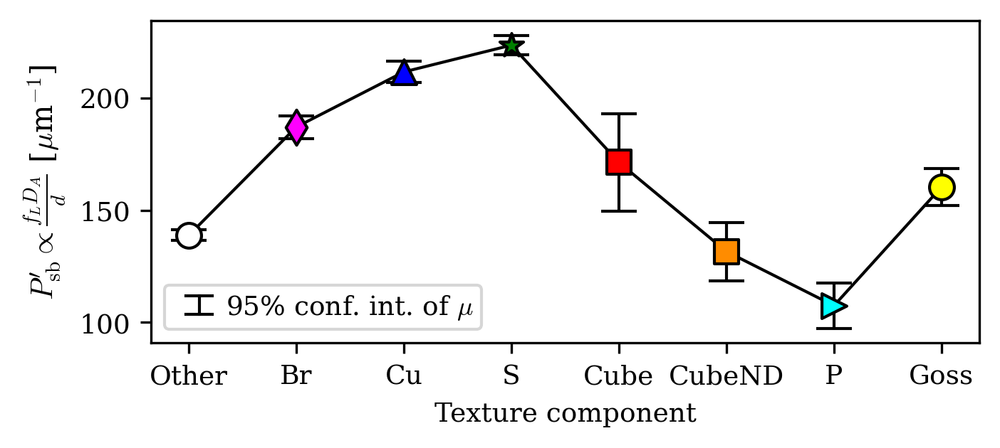

In [70]:
fs = plt.rcParams["font.size"]
plt.rcParams["font.size"] = 9

fig, ax = plt.subplots(figsize=(5, 2))
ax.plot(p_sz_prop, "k-")
ax.set_ylabel(r"$P_{\mathrm{sb}}' \propto \frac{f_L D_A}{d}$ [$\mu$m$^{-1}$]", fontsize=10)
ax.set_xlabel("Texture component")
ax.set_xticks(np.arange(n_grains.size))
ax.set_xticklabels(comp_names)
for i in range(n_ideal):
    ax.scatter(i, p_sz_prop[i], color=comp_colors[i], marker=comp_markers[i], **marker_kwds)
    ax.errorbar(i, p_sz_prop[i], yerr=p_delta[i], fmt="none", color="k", capsize=6)

ax.legend(
    [AnyObject()],
    ["95% conf. int. of $\mu$"],
    handler_map={AnyObject: AnyObjectHandler()},
    handletextpad=0,
    borderpad=0.3,
    loc="lower left",
)
fig.savefig(
    os.path.join(dir_article_fig, "smith_zener_drag", "smith_zener_drag.svg"), **savefig_kwds
)
plt.rcParams["font.size"] = fs